# Download the dataset here!
https://ucsb.box.com/s/nefr3he9nblnpx4kvkcvvse3hyfc66qd

## Also make sure to download all the packages as well as pip install if necessary!

In [1]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize 
from nltk.corpus import stopwords
from nltk.tag import pos_tag_sents
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, linear_model
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from nltk.stem import PorterStemmer
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from collections import Counter
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import *
import pandas as pd ## call pandas functions using "pd"
import numpy as np  ## call numpy functions using "np"
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

# Behind the Beat: An Analysis of Popular Music in the 2000s

#### Team members:

Megan Handa

Dennis Wang

### Abstract

The purpose of this project aims to help us better understand the “X” factors of top scoring musics in the industry rankings by analyzing their musical attributes and important characteristics that define highlights of our generation. Our project seeks to help develop a model which can help forecast whether a song can be a “hit” song with reasonable computational time and ease of interpretability. In addition, we seek to identify the important music attributes that would give us the most useful information using the least amount of characteristics as possible. First, the datasets were merged and preprocessed for data cleaning. This was done to ensure proper datasets were obtained that did not have missing entries or incorrect alignment due to human errors and missing assumptions. This is followed up with exploratory data analysis to gain insight about our data including dimensionality reduction and class imbalance visualization. Through data processing and exploratory analysis, ultimately three models were build that addressed the predictive power based on the dataset. Ultimately post PCA random forest was selected for its optimal performance. The predicted values provide a promise in sharpening the power of machine learning, industry development and assessment, as well as improvement research in statistical methods.

### Introduction

Music itself has progressed in numerous ways as time progressed. What was once only live music is now shared across the globe numerous times via multi-billion dollar music streaming industries such as Apple Music, Pandora, Spotify, and Tidal. As these streaming services become increasingly popular, it is increasingly beneficial to music artists and producers to understand what are some of the popular trending features defying this decade. These trend identifications have applications to marketing, and decision making in the music industry as well as helping musicians, musical historians and sociologists understand characteristics that would categorize songs across the generations.

For the purpose of this report, we defined whether a song was a hit or not by comparing the list of songs streamed and released against the list of songs Billboard 200 released weekly and implemented a threshold to assign the hits. We developed our models using data from a combined dataset sources of Spotify, Pitchfork and Billboard in making our analysis possible.

### Questions of interest

To help us identify the features of a “hit” song, we came up with three main questions that guided us to our goal

1). How do we categorize music of the 2000’s?

2). Given song attributes, can we predict a “hit” song?

3). Do critic reviews provide useful information in determining music's popularity?


## Data Description and Data Preprocessing:

Our datasets consist of over 10,000 observations within each dataset with numerous variables in the Spotify dataset for its acoustic features as the explanatory variables. Other datasets such as Pitchfork reviews, Billboard 200’s and Album reviews consisted of categorical attributes that identifies the respective artist, song, and albums as well as the date the measurements were recorded. In addition, a critic score and the review are also important from the Pitchfork reviews. The help of common shared keys such as artist and album has allowed the usage of the four combined dataset with ease.

Read In Data

In [3]:
acoustic_data=pd.read_csv("acoustic_features.csv")
albums_data=pd.read_csv("albums.csv")
reviews_data=pd.read_csv("reviews.csv")
top_songs = pd.read_csv('Billboard Top Songs.csv')

What does our data look like? 

In [4]:
acoustic_data.head(2)

,index,id,song,album,artist,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,album_id,date
0,0,0Veyvc3n9AcLSoK3r1dA12,Voices In My Head,Hoodie SZN,A Boogie Wit da Hoodie,0.0555,0.754,142301.0,0.663,0.0,6.0,0.101,-6.311,0.0,0.427,90.195,4.0,0.207,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21
1,1,77JzXZonNumWsuXKy9vr3U,Beasty,Hoodie SZN,A Boogie Wit da Hoodie,0.2920,0.860,152829.0,0.418,0.0,7.0,0.106,-9.061,0.0,0.158,126.023,4.0,0.374,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21


In [5]:
albums_data.head(2)

,index,id,date,artist,album,rank,length,track_length
0,0,1,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2,2019-01-19,A Boogie Wit da Hoodie,Hoodie SZN,1.0,20.0,185233.8


Here, we see that the first row is empty, so we proceed to drop the first row. 

In [6]:
albums_data = albums_data.drop(albums_data.index[0])
albums_data.head(5)

,index,id,date,artist,album,rank,length,track_length
1,1,2,2019-01-19,A Boogie Wit da Hoodie,Hoodie SZN,1.0,20.0,185233.800000
2,2,3,2019-01-19,21 Savage,I Am > I Was,2.0,15.0,211050.733333
3,3,4,2019-01-19,Soundtrack,Spider-Man: Into The Spider-Verse,3.0,13.0,190866.384615
4,4,5,2019-01-19,Meek Mill,Championships,4.0,19.0,219173.894737
5,5,6,2019-01-19,Post Malone,beerbongs & bentleys,5.0,18.0,214113.611111


In [7]:
reviews_data.head(5)

,index,id,artist,album,genre,score,date,author,role,review,bnm,link
0,0,0,David Byrne,“…The Best Live Show of All Time” — NME EP,Rock,5.5,January 11 2019,Andy Beta,Contributor,"Viva Brother, Terris, Mansun, the Twang, Joe L...",0,https://pitchfork.com/reviews/albums/david-byr...
1,1,1,DJ Healer,Lost Lovesongs / Lostsongs Vol. 2,Electronic,6.2,January 11 2019,Chal Ravens,Contributor,"The Prince of Denmark—that is, the proper prin...",0,https://pitchfork.com/reviews/albums/dj-healer...
2,2,2,Jorge Velez,Roman Birds,Electronic,7.9,January 10 2019,Philip Sherburne,Contributing Editor,"Jorge Velez has long been prolific, but that’s...",0,https://pitchfork.com/reviews/albums/jorge-vel...
3,3,3,Chandra,Transportation EPs,Rock,7.8,January 10 2019,Andy Beta,Contributor,When the Avalanches returned in 2016 after an ...,0,https://pitchfork.com/reviews/albums/chandra-t...
4,4,4,The Chainsmokers,Sick Boy,Electronic,3.1,January 9 2019,Larry Fitzmaurice,Contributor,We’re going to be stuck with the Chainsmokers ...,0,https://pitchfork.com/reviews/albums/the-chain...


Billboard Data 
Each row of data represents a song and the corresponding position on that week's chart. Included in each row are the following elements:
- Billboard Chart URL
- WeekID
- Song name
- Performer name
- SongID - Concatenation of song and performer
- Current week on chart
- Instance (this is used to separate breaks on the chart for a given song. Ex: instance of 6 indicates the sixth time      this song has appeared on the chart)
- Previous week position
- Peak Position (as of the corresponding week)
- Weeks on Chart (as of the corresponding week)

Album Data - list of billboard top 200 by week.
- Index 
- Id 
- Date 
- Artist 
- Album 
- Rank : ranking of song  
- Length 
- Track_length :duration in milliseconds

Reviews Data
- Index 
- ID 
- Artist 
- Album 
- Genre 
- Score 
- Date 
- Author 
- Role : Role in review 
- Review : First few words of review
- BNM 
- Link : link to review


Acoustic Features Data 
- Index : Number used to extract data, 
- Id 
- Song  
- Album  
- Artist
- Acousticness : confidence measure from 0.0 to 1.0 of whether the track is acoustic
- Danceability : how suitable a track is for dancing based on a combination of musical elements
- Duration_ms : duration of the track in milliseconds
- Energy : represents a perceptual measure of intensity and activity
- Instrumentalness: Predicts whether a track contains no vocals
- Key : key the track is in. Integers map to pitches using standard Pitch Class notation
- Liveness : Detects the presence of an audience in the recording
- Loudness : overall loudness of a track in decibels
- Mode : indicates the modality (major or minor) of a track (Major = 1, minor = 0)
- Speechiness : detects the presence of spoken words in a track
- Tempo : overall estimated tempo of a track in beats per minute
- Time_Signature : estimated overall time signature of a track
- Valence : musical positiveness conveyed by a track, album_id, date

### Observations
The great thing that all of the datasets shared was that there was a common key(s) that was(were) shared among the datasets. As a result, we anticipated that merging these datasets would be relative ease. However, our initial merge turned out completely different than expected and we faced a number of challenges that made preprocessing one of our most time consuming steps. Our main tasks stemmed from combining files, checking for missing values, aligning artists with different name entries across different datasets, and removing repetitive or overcounted variables.

### 1) First we dealt with case of missing values, but we should check the rest of the data sets to ensure we are not working with incomplete data. 

In [8]:
print("Missing Values:")
print ('acoustic:', acoustic_data.isnull().sum().sum()) 
print ('album:',albums_data.isnull().sum().sum())
print ('reviews:',reviews_data.isnull().sum().sum())
print ('songs:',top_songs.isnull().sum().sum())

Missing Values:
acoustic: 116
album: 186542
reviews: 5809
songs: 8808


Now, we see that we have a lot of missing values, but that doesn't mean we should just toss the rows with missing values. For example, in top_songs, a NaN value for previous week position means that it is new on the chart - not a row we want to eliminate! 

Looking through the data, we decide on the following essential variables: 
acoustic_data: song, album,artist, date
albums_data: date, album, artist, rank
reviews_data: album,review,score
top_songs: song, performer, week position, weekID, instance, previous week position, peak position, weeks on chart

#### If an observation has a missing "essential" variable, we will remove it from our data set so that we are not missing any crucial information for our data analysis.

In [9]:
essential_vars = [(acoustic_data,['song', 'artist', 'album','date']),(albums_data,['date','album','artist','rank']),(reviews_data,['album','review','score']),(top_songs,['Song','Performer','Week Position','WeekID','Instance','Previous Week Position','Peak Position','Weeks on Chart'])]
for (x,y) in essential_vars:
    x = x.dropna(subset=y)

### 2) Now that we've dealt with missing data, we want to make sure that all of our data corresponds to the same date range.

When devising our project, we realized that there was a distinct "style" of popular music characterizing the '60s, '70s, '80s, and '90s, but the style became harder to distinguish in the 2000s. For this reason, we will focus our study on what makes music popular in the new millenium, subsetting our data from 2000 onwards. 

In [10]:
albums_data = albums_data[(albums_data['date'] >= '2000-01-01')]
top_songs['WeekID'] = pd.to_datetime(top_songs['WeekID'])
top_songs = top_songs[(top_songs['WeekID'] >= '2000-01-01')]

We also need to make sure that the most recent entries line up, so we check the end date of our data

In [11]:
print('albums_data end date:', max(albums_data['date']))
print('top_songs end date:', max(top_songs['WeekID']))

albums_data end date: 2019-01-19
top_songs end date: 2018-12-29 00:00:00


We see that top_songs ends in 2018 while albums_data continues into early 2019, so we will focus our study on the dates when we have observations in both datasets, from 2000-2018. 

In [12]:
albums_data = albums_data[(albums_data['date'] >= '2000-01-01') & (albums_data['date'] < '2019-01-01' )]

Here, we must deal with repeats of songs. 

In [13]:
top_songs_sort = top_songs.sort_values(by = ['Song','Performer','Weeks on Chart'], ascending = False )
print ('Top Songs Original Size:', top_songs_sort.shape)
top_songs_norepeat = top_songs_sort.drop_duplicates(subset=['Song','Performer'], keep='first')
print ('Top Songs New Size:', top_songs_norepeat.shape)
acoustic_data_sort = acoustic_data.sort_values(by = ['song','artist'], ascending = False)
print ('Acoustic Original Size:', acoustic_data_sort.shape)
acoustic_data_norepeat = acoustic_data_sort.drop_duplicates(subset=['song','artist'], keep='first')
print ('Acoustic New Size:', acoustic_data_norepeat.shape)

top_songs_norepeat.duplicated(subset = ['Song','Performer']).sum() == 0

Top Songs Original Size: (99200, 10)
Top Songs New Size: (7462, 10)
Acoustic Original Size: (339855, 20)
Acoustic New Size: (325350, 20)


True

In [14]:
print (top_songs_norepeat.duplicated(subset = ['Song','Performer']).sum() == 0)
print (acoustic_data_norepeat.duplicated(subset = ['song','artist']).sum() == 0)

True
True


In [15]:
top_songs_merged = pd.merge(top_songs_norepeat,acoustic_data_norepeat, how='inner',
                          right_on=['song','artist'],left_on=['Song','Performer'])
print('Merged Size:', top_songs_merged.shape)

Merged Size: (3385, 30)


Which artists put out the most "Top 100" songs

In [16]:
#Sample output
top_artists=top_songs_merged.groupby('Performer').count()
top_artists.head(3)

,url,WeekID,Week Position,Song,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart,index,...,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,album_id,date
Performer,,,,,,,,,,,,,,,,,,,,,
"""Weird Al"" Yankovic",1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
'N Sync,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
(+44),1,1,1,1,1,1,0,1,1,1,...,1,1,1,1,1,1,1,1,1,1


While we see a number of distinct artists here, there are many cases where an artist is listed multiple times during a "feature" on someone else's song. We felt that the best way to deal with these cases was to not give artists credit for songs they are "featured" on, as it is usually a single verse/chorus and they are not really contributing much to the song.

### 3) Splitting unique artist strings to account only the main contributing artist

In [17]:
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split('Featuring').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split('&').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(',').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' x ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' X ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' Feat ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' feat. ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' feat ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split('/').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' / ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.split(' Feat. ').str[0]
top_songs_merged['Performer'] = top_songs_merged['Performer'].str.strip()
print(top_songs_merged.shape)
top_songs_merged['Performer'].tolist()
top_artists=top_songs_merged.groupby('Performer').count()
top_artists.head(5)

(3385, 30)


,url,WeekID,Week Position,Song,SongID,Instance,Previous Week Position,Peak Position,Weeks on Chart,index,...,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,album_id,date
Performer,,,,,,,,,,,,,,,,,,,,,
"""Weird Al"" Yankovic",1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
'N Sync,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5
(+44),1,1,1,1,1,1,0,1,1,1,...,1,1,1,1,1,1,1,1,1,1
10 Years,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2 Chainz,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


## Exploratory Data Analysis

### Who has the most hit songs?

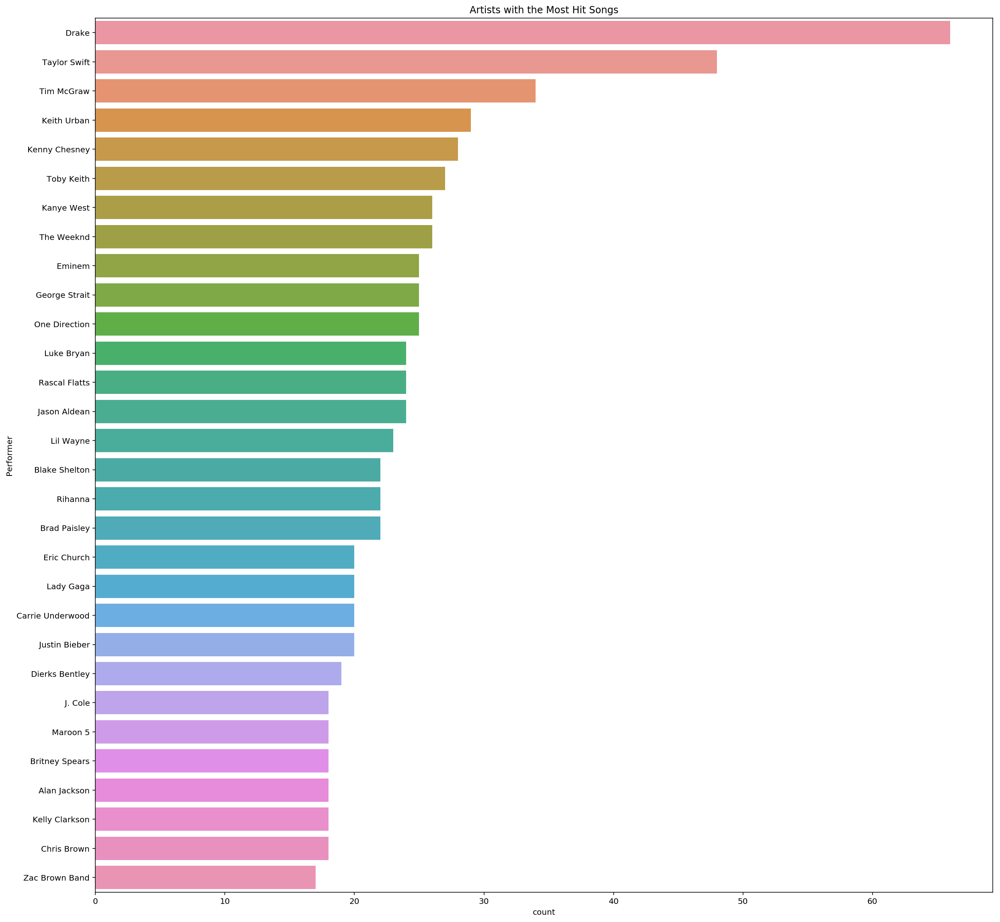

In [18]:
plt.figure(figsize=(20,20)) #Feel free to change the numbers for size!
ax = sns.countplot(y='Performer', data=top_songs_merged,order=pd.value_counts(top_songs_merged['Performer']).iloc[:30].index)
ax.set_title('Artists with the Most Hit Songs');

From looking at the distribution of times an artist makes the top 200, we can see that there’s a small number of artists that have an exorbitant amount of hits. After Drake and Taylor Swift, we see that there’s less of a difference between the rest of the 30 top performers. 

### 4) Additional processing and dropping repeated columns

If we do a left join, we see that we have 644195 rows, whereas an inner join has 626867. The cases where we don't have characteristic data do not help us in this analysis so we will exclude them and use just the inner join. 

In [19]:
top_songs_merged.columns.values

array(['url', 'WeekID', 'Week Position', 'Song', 'Performer', 'SongID',
       'Instance', 'Previous Week Position', 'Peak Position',
       'Weeks on Chart', 'index', 'id', 'song', 'album', 'artist',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'album_id',
       'date'], dtype=object)

We can see from our combined dataframe that not all variables are contributing to analysis - for example, the URL, Song ID, album_ID, index, and id are just references and do not contribute additional information, so we will drop them. We can also rename a few columns to make it more clear, for example, artist and performer are the same value so we can drop one. WeekID refers to the week it was popular, while date refers to release date, which can be clarified. 

In [20]:
top_songs_merged['chart_date'] =top_songs_merged['WeekID']
top_songs_merged['release_date'] = top_songs_merged['date']
top_songs_merged = top_songs_merged.drop(['url','SongID','index', 'id','album_id', 'WeekID','date','artist'], 1)
top_songs_merged.head()

,Week Position,Song,Performer,Instance,Previous Week Position,Peak Position,Weeks on Chart,song,album,acousticness,...,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,chart_date,release_date
0,99.0,www.memory,Alan Jackson,1.0,89.0,45.0,15.0,www.memory,Greatest Hits Volume II,0.5720,...,5.0,0.3330,-7.535,1.0,0.0260,94.073,4.0,0.726,2001-02-10,2003
1,79.0,whoa (mind in awe),XXXTENTACION,1.0,37.0,37.0,2.0,whoa (mind in awe),Skins,0.6530,...,6.0,0.1010,-2.939,0.0,0.0441,160.147,4.0,0.369,2018-12-29,2018-12-07
2,65.0,teachme,Musiq Soulchild,1.0,66.0,42.0,20.0,teachme,Luvanmusiq,0.4730,...,8.0,0.0722,-5.110,0.0,0.1350,172.969,3.0,0.436,2007-10-06,2007-03-13
3,84.0,sobeautiful,Musiq Soulchild,3.0,89.0,84.0,11.0,sobeautiful,onmyradio,0.0656,...,7.0,0.0885,-7.048,0.0,0.0637,133.987,4.0,0.210,2009-06-27,2008-11-24
4,96.0,i,Kendrick Lamar,1.0,80.0,39.0,11.0,i,To Pimp A Butterfly,0.7080,...,8.0,0.7200,-4.286,1.0,0.3240,120.094,4.0,0.753,2014-12-20,2015-03-16


In [21]:
top_songs_merged.columns.values

array(['Week Position', 'Song', 'Performer', 'Instance',
       'Previous Week Position', 'Peak Position', 'Weeks on Chart',
       'song', 'album', 'acousticness', 'danceability', 'duration_ms',
       'energy', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'speechiness', 'tempo', 'time_signature', 'valence',
       'chart_date', 'release_date'], dtype=object)

### Post 2000's

In [22]:
#subsetting songs into different decades 
#2000-2009 and 2010-2019
#Characteristics are 9 to 22?
before2010=top_songs_merged[(top_songs_merged['release_date']>='2000-01-01') 
                        & (top_songs_merged['release_date']<='2010-01-01')]
after2010=top_songs_merged[(top_songs_merged['release_date']>='2010-01-01')]

In [23]:
features2000=before2010.iloc[:,9:22]
features2010=after2010.iloc[:,9:22]
feat=list(features2000.columns)

In [24]:
features2000.head(5)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,0.572000,0.701,154200.0,0.503,0.000000,5.0,0.3330,-7.535,1.0,0.0260,94.073,4.0,0.726
2,0.473000,0.499,260773.0,0.610,0.000000,8.0,0.0722,-5.110,0.0,0.1350,172.969,3.0,0.436
3,0.065600,0.689,291133.0,0.562,0.000000,7.0,0.0885,-7.048,0.0,0.0637,133.987,4.0,0.210
5,0.000218,0.631,189373.0,0.793,0.000056,1.0,0.0976,-4.086,0.0,0.0468,136.960,4.0,0.648
13,0.331000,0.742,211893.0,0.638,0.000221,6.0,0.0584,-4.332,1.0,0.0239,100.504,4.0,0.748


### By looking at the 13 distributions of the feature attributes of songs in the 2000s vs 2010s, we see that there isn’t a noticeable difference in the eras. 

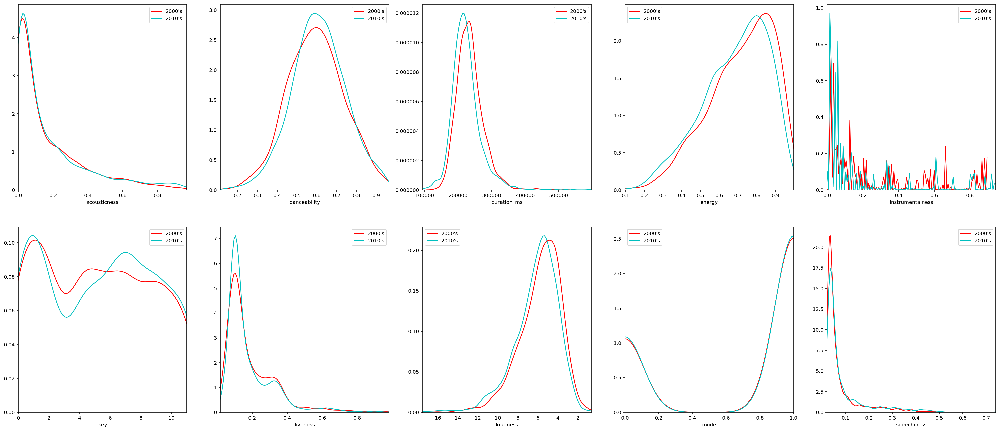

In [25]:
fig, ax = plt.subplots(2, 5, figsize=(35, 15))
#hist_kws=dict(alpha=0.25)
for i in range(10):
    sns.distplot(features2000[feat[i]],hist=False,bins=30,color='r',
                 label="2000's",axlabel=feat[i],ax=ax[i//5, i % 5])
    sns.distplot(features2010[feat[i]],hist=False,bins=30,color='c',
                 label="2010's",axlabel=feat[i],ax=ax[i//5, i % 5])
    #limx=min()
    ax[i//5, i % 5].set(xlim=(min(min(features2000[feat[i]]),min(features2010[feat[i]])),
                              max(max(features2000[feat[i]]),max(features2010[feat[i]]))))

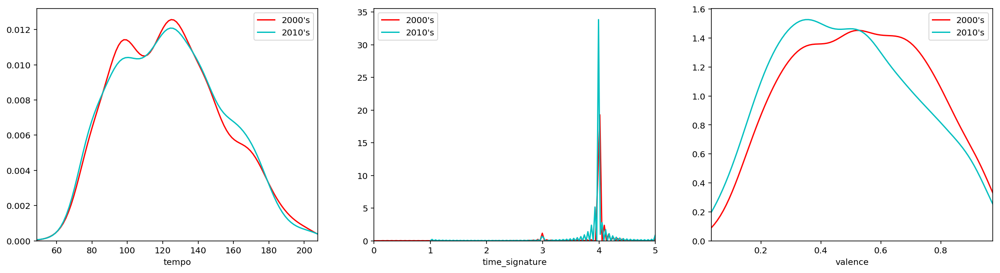

In [26]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
for i in range(10, 13):
    sns.distplot(features2000[feat[i]],hist=False,bins=30,color='r',
                 label="2000's",axlabel=feat[i],ax=ax[i-10])
    sns.distplot(features2010[feat[i]],hist=False,bins=30,color='c',
                 label="2010's",axlabel=feat[i],ax=ax[i-10])
    ax[i-10].set(xlim=(min(min(features2000[feat[i]]),min(features2010[feat[i]])),
                              max(max(features2000[feat[i]]),max(features2010[feat[i]]))))

### Now, we examine the data for both hit and not hit songs. First, we must find a list of "not hit" songs.

This was computed by using the top 100 songs as threshold instead of all the top 200.

In [27]:
#find songs not in top_songs
not_top_songs = pd.merge(acoustic_data, top_songs, left_on='song', right_on='Song', how = 'left')
not_top_songs = not_top_songs[not_top_songs['Song'].isnull()]
not_top_songs.columns.values
not_top_songs = not_top_songs[['song', 'album', 'artist', 'acousticness',
       'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'speechiness', 'tempo',
       'time_signature', 'valence','album_id', 'date']]

In [28]:
not_top_songs.head()

,song,album,artist,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,album_id,date
0,Voices In My Head,Hoodie SZN,A Boogie Wit da Hoodie,0.0555,0.754,142301.0,0.663,0.000000,6.0,0.101,-6.311,0.0,0.427,90.195,4.0,0.207,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21
1,Beasty,Hoodie SZN,A Boogie Wit da Hoodie,0.2920,0.860,152829.0,0.418,0.000000,7.0,0.106,-9.061,0.0,0.158,126.023,4.0,0.374,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21
13,Swervin (feat. 6ix9ine),Hoodie SZN,A Boogie Wit da Hoodie,0.0153,0.581,189487.0,0.662,0.000000,9.0,0.111,-5.239,1.0,0.303,93.023,4.0,0.434,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21
14,Startender (feat. Offset and Tyga),Hoodie SZN,A Boogie Wit da Hoodie,0.0235,0.736,192779.0,0.622,0.000000,6.0,0.151,-4.653,0.0,0.133,191.971,4.0,0.506,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21
15,Demons and Angels (feat. Juice WRLD),Hoodie SZN,A Boogie Wit da Hoodie,0.0114,0.810,214593.0,0.550,0.000006,2.0,0.107,-7.460,0.0,0.170,76.503,4.0,0.183,3r5hf3Cj3EMh1C2saQ8jyt,2018-12-21


In [29]:
not_top_songs_numeric=not_top_songs.iloc[:,3:16]
top_songs_numeric=top_songs_merged.iloc[:,9:22]
feat=list(not_top_songs_numeric.columns)

### Top songs appears to be more energetic, louder, less speech and more danceable

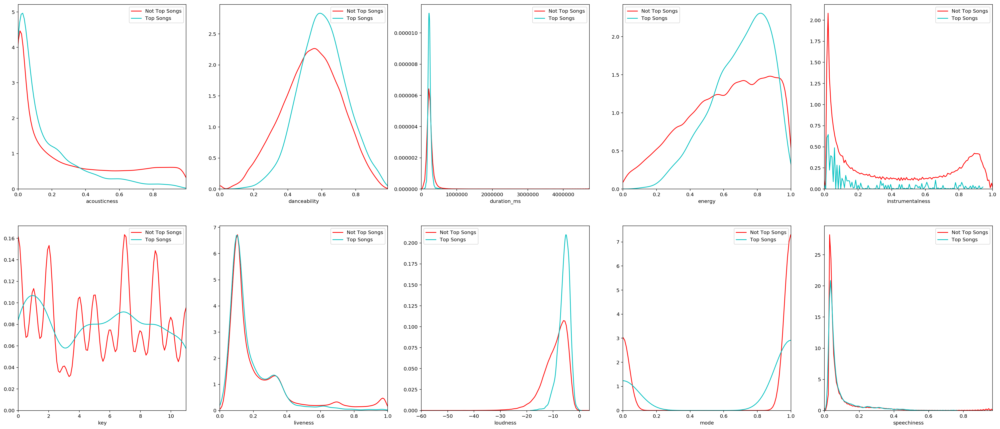

In [30]:
fig, ax = plt.subplots(2, 5, figsize=(35, 15))
#hist_kws=dict(alpha=0.25)
for i in range(10):
    sns.distplot(not_top_songs_numeric[feat[i]],hist=False,bins=30,color='r',
                 label="Not Top Songs",axlabel=feat[i],ax=ax[i//5, i % 5])
    sns.distplot(top_songs_numeric[feat[i]],hist=False,bins=30,color='c',
                 label="Top Songs",axlabel=feat[i],ax=ax[i//5, i % 5])
    #limx=min()
    ax[i//5, i % 5].set(xlim=(min(min(not_top_songs_numeric[feat[i]]),min(top_songs_numeric[feat[i]])),
                              max(max(not_top_songs_numeric[feat[i]]),max(not_top_songs_numeric[feat[i]]))))

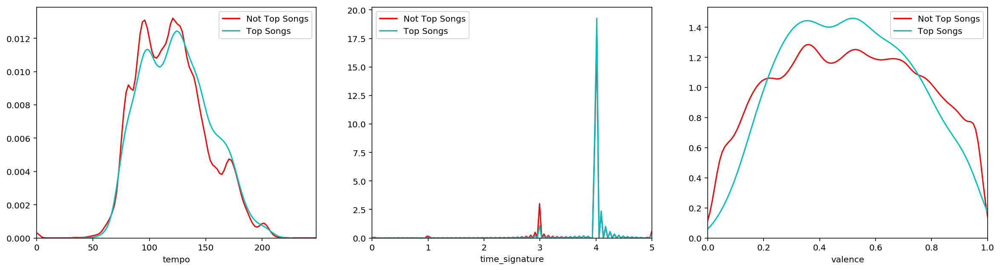

In [31]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
for i in range(10, 13):
    sns.distplot(not_top_songs_numeric[feat[i]],hist=False,bins=30,color='r',
                 label="Not Top Songs",axlabel=feat[i],ax=ax[i-10])
    sns.distplot(top_songs_numeric[feat[i]],hist=False,bins=30,color='c',
                 label="Top Songs",axlabel=feat[i],ax=ax[i-10])
    ax[i-10].set(xlim=(min(min(not_top_songs_numeric[feat[i]]),min(top_songs_numeric[feat[i]])),
                              max(max(not_top_songs_numeric[feat[i]]),max(top_songs_numeric[feat[i]]))))

In [32]:
# create a copy of acoustic_data to modify to find yearly averages of song traits
newdf = acoustic_data

# change the date column to be in a pd date format
newdf['date'] = pd.to_datetime(acoustic_data['date'], format='%Y-%m-%d')

# Group the observations by year
groupedMean = newdf.groupby(newdf.date.dt.year).mean()

# Remove the index column and start in 1956 - the earliest point where theres an album every single year
groupedMeanFinal = groupedMean.iloc[8:,1:]

# Create a list of all of the column attributes 
colGroupedMean = list(groupedMean.columns)

### Trend analysis

From looking at the yearly averages of song attributes, we can see that acousticness decreased in the early 2000s but has been on the rise since 2010. We can also see that energy has been on the rise since the 2000s, while speech rose in the early 2000s, but started to decrease after 2010. These trends demonstrate how there have been more high energy songs in the past decade that focus more on the instruments than on the lyrics.


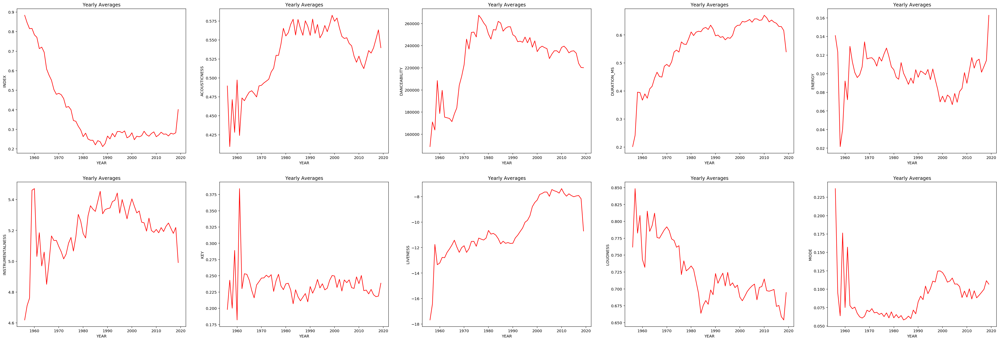

In [33]:
# Plot first 10 yearly attribute averages

fig, ax = plt.subplots(2, 5, figsize=(45, 15))

for i in range(10):
    ax[i//5, i % 5].plot(groupedMeanFinal.iloc[:,i], color='r')
    ax[i//5, i % 5].set_title("Yearly Averages")
    ax[i//5, i % 5].set(xlabel='YEAR', ylabel=colGroupedMean[i].upper())       

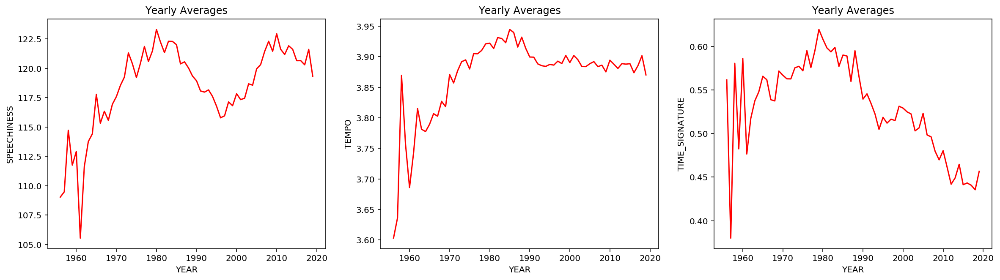

In [34]:
# Plot last 3 yearly attribute averages

fig, ax = plt.subplots(1, 3, figsize=(20, 5))
for i in range(10, 13):
    ax[i-10].plot(groupedMeanFinal.iloc[:,i], color='r')
    ax[i-10].set_title("Yearly Averages")
    ax[i-10].set(xlabel='YEAR', ylabel=colGroupedMean[i].upper())


## Text characteristics and feature correlations

In today’s age, social media and reviews have become an integrated part of our lives whether it be restaurant recommendations to Amazon and Yelp reviews. Thus, we wondered if album reviews would also provide useful information relative to the performance on the Billboard Top 200’s.

In [35]:
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [36]:
# Defining some functions

#Build stop words
stop_words = set(stopwords.words('english'))

#Build alphabets lower and upper
alphabet = []
for letter in range(65, 91):
    alphabet.append(chr(letter))
for letter in range(97,123):
    alphabet.append(chr(letter))
    
def remove_stopword(wordfile): #Read in the tokenized words
    return([i for i in wordfile if not str.lower(i) in stop_words]) #Removing stop words

#This uses the output from remove_stopword
def just_words(no_stopword_file):
    result=[]
    for i in no_stopword_file:
        if i[0] in alphabet:
            result.append(i)
    return(result)

In [37]:
#This fuction put a list of sentences in and return the list of score
def get_comp(sentences):
    comp_score=[]
    #insert sentences in
    for sentence in sentences:
        ss=sid.polarity_scores(sentence)
        comp_score.append(ss['compound'])
    return(comp_score)
#This function assigns the compound score as pos,neu or neg
def assign_pos(comp_score):
    result=[]
    for i in comp_score:
        if i>=0.05:
            result.append('positive')
        if (i<0.05)|(i>=-0.05):
            result.append('neutral')
        if i<-0.05:
            result.append('negative')
    return(result)

#Categorize percentages based on frequency
def assign_percent(comp_score):
    pos=comp_score.count('positive')/len(comp_score)
    neu=comp_score.count('neutral')/len(comp_score)
    neg=comp_score.count('negative')/len(comp_score)
    return [pos] , [neu], [neg]

#count words in a review after removing stop words and non words
def word_count(review):
    words=word_tokenize(review)
    nostop=remove_stopword(words)
    just_word=just_words(nostop)
    return len(just_word)

after2000=top_songs_merged[(top_songs_merged['release_date']>='2000-01-01') 
                        & (top_songs_merged['release_date']<'2019-01-01')]
after2000list=after2000['Performer'].unique()

In [38]:
droppednan=reviews_data.dropna() #Remove missing data rows
droppednan2=droppednan[droppednan['artist'].isin(after2000list)]

justreview=droppednan[['artist','album','review','score']] #relevant info
subset=droppednan.iloc[:2000,:] #Make a large enough sample size
subreview=list(subset['review'])
name_album=list(subset['album'])
reviewscore=list(subset['score'])

#Initialize a new dataframe component
sentences=sent_tokenize(subreview[0])
a=get_comp(sentences)
b=assign_pos(a)
c=assign_percent(b)

x=word_tokenize(subreview[0])
y=remove_stopword(x)
z=just_words(y)

fullreview=list(justreview['review'])
fullalbum=list(justreview['album'])

d={'album2':[name_album[0]],'pos':c[0],'neu':c[1],'neg':c[2],
   'Wordcount':len(z),'score':reviewscore[0]}
score_df=pd.DataFrame(data=d)

### EDA with text features

Before doing any analysis with our reviews, it is important to see some characteristics of these reviews to ensure there are no bias or anomalies in the dataset.

#### What kind of scores do critics usually give?

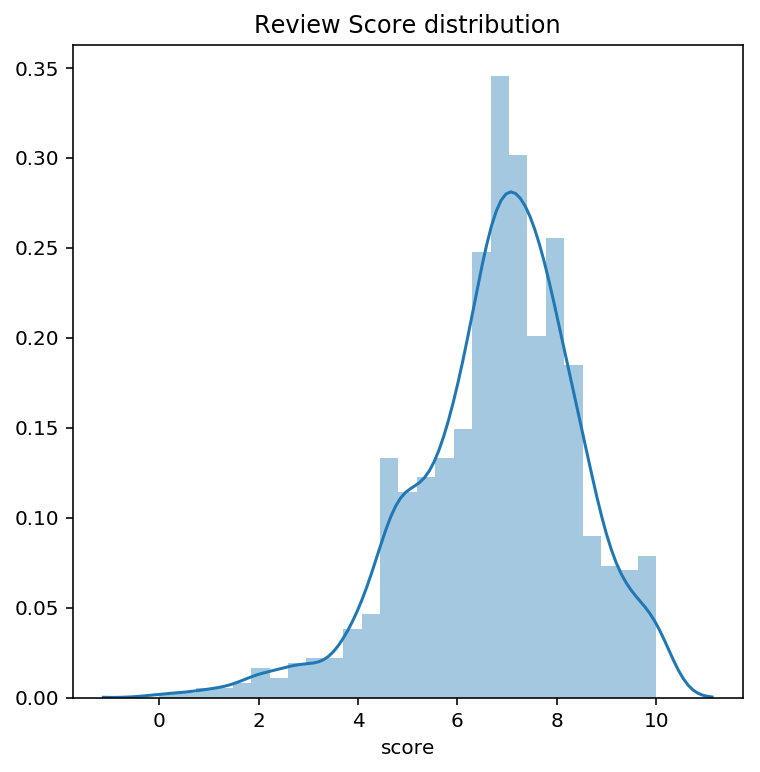

In [39]:
plt.figure(figsize=(6,6))
plt.title('Review Score distribution')
sns.distplot(droppednan2['score']);

Based on the looks of this graph, critics usually give an album average ratings indicating satisfactory. Of course, this doesn't really give us much information as we should look for more information about scores assigend for different genres instead as well as the era we are interested in.

#### Filter out to only 2000-2018

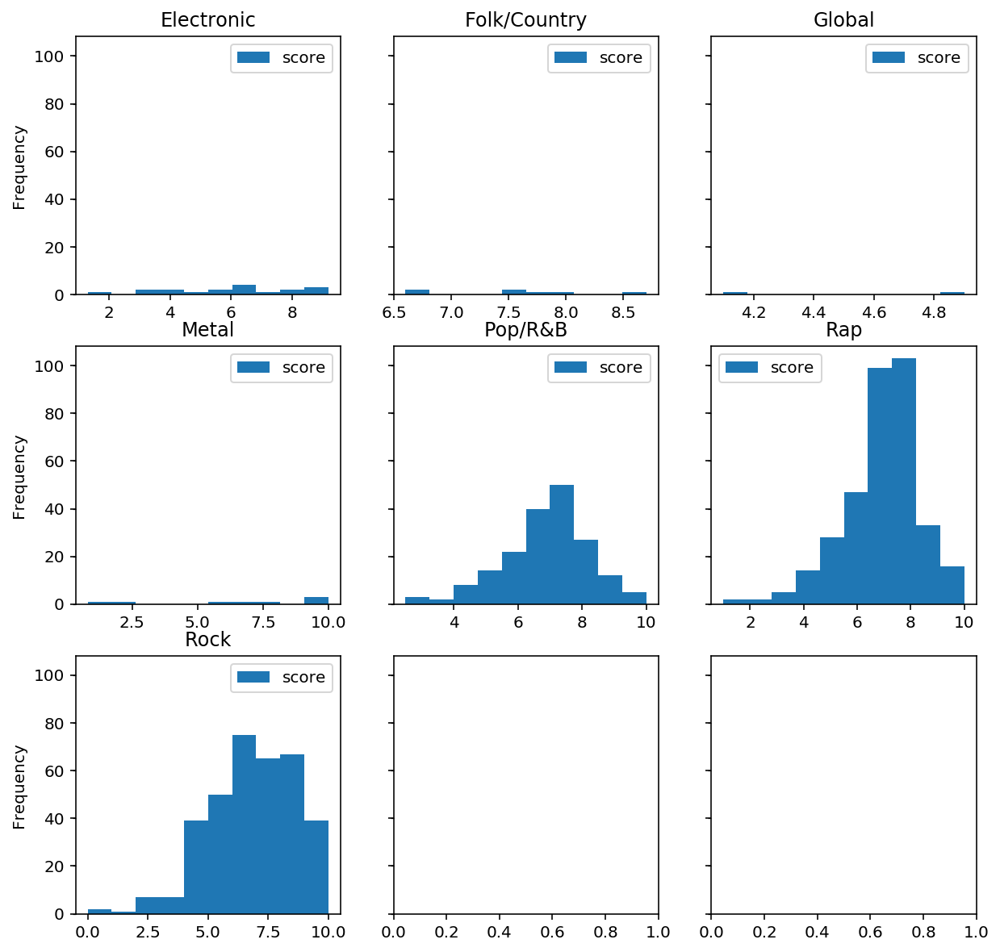

In [40]:
big_generes=['Rock','Rap','Pop','Electronic','Experimental','Pop/R&B',
          'Metal','Country','Jazz','Folk/Country','Global','Country']
genrescore=droppednan2[droppednan2['genre'].isin(big_generes)]
genrescore=genrescore[['genre','score']]

genrescoreall=droppednan[droppednan['genre'].isin(big_generes)]
genrescoreall=genrescoreall[['genre','score']]

grouped=genrescore.groupby('genre')
ncols=3
nrows=3
fig,axes=plt.subplots(nrows=nrows,ncols=ncols,
                      figsize=(10,10),sharey=True)
for (key,ax) in zip(grouped.groups.keys(),axes.flatten()):
    grouped.get_group(key).plot(kind='hist',ax=ax,title=key)
ax.legend()
plt.show()

Most of the scores given by critics are satisfactory across different genres, which is surprising given there seems to be almost no bias at all which doesn't seem common among review critics.

### What genre seems to be the most popular for review?

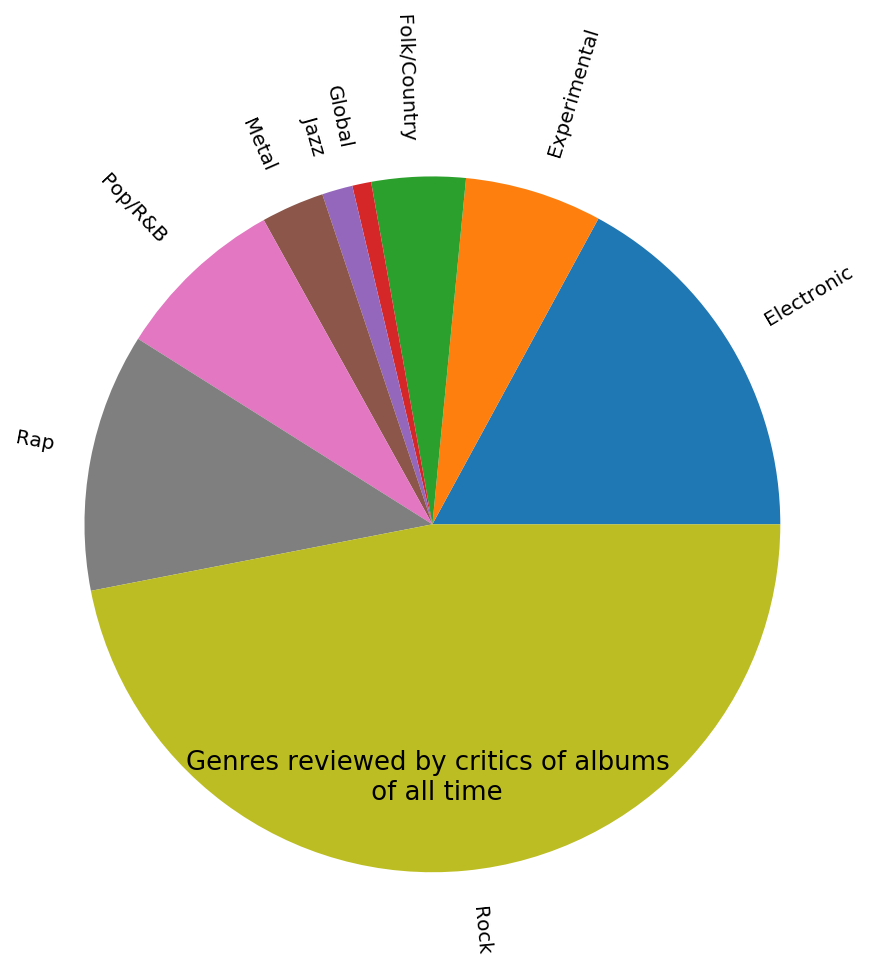

In [41]:
grouped2=genrescoreall.groupby('genre').count()
grouped3=genrescore.groupby('genre').count()

plt.xlabel('Genres reviewed by critics of albums \n of all time',size=13)
plt.pie(grouped2['score'],labels=grouped2.index.values,
        radius=2,rotatelabels=True);

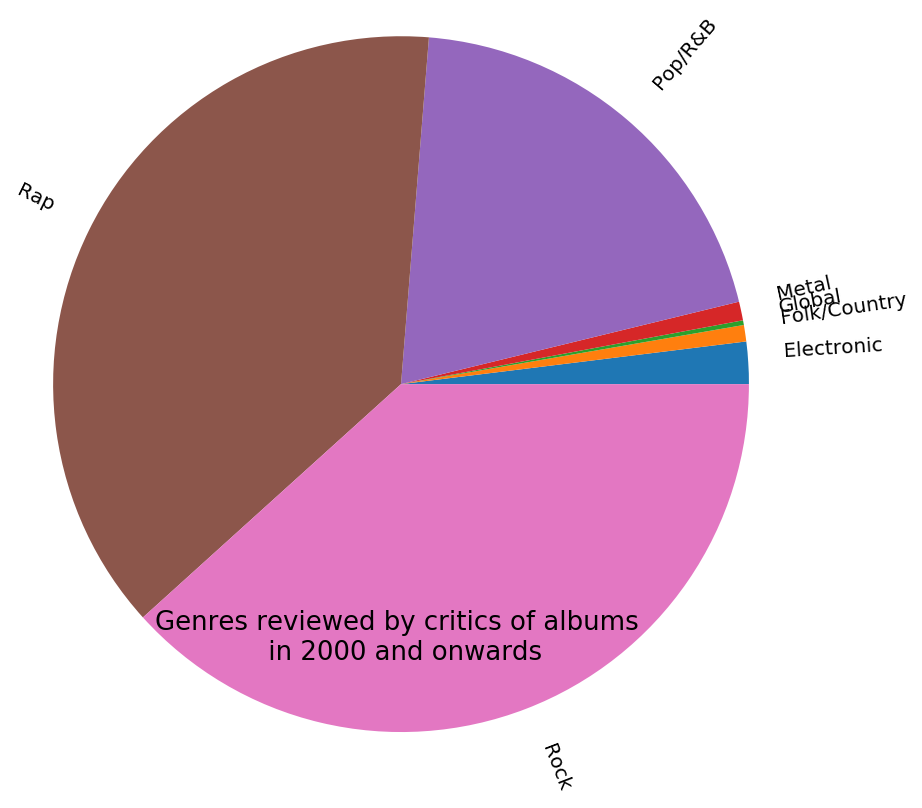

In [42]:
plt.xlabel('Genres reviewed by critics of albums \n in 2000 and onwards',size=13)
plt.pie(grouped3['score'],labels=grouped3.index.values,
        radius=2,rotatelabels=True);

This result is rather interesting and insightful as it seems that rock genre has stood against the test of time being one of the most popular genres. Could this be due to legacy left by legendary artists like The Beatles that every generation loves? That being said, in our decade, it appears there there is a shift in taste of music as rap and Pop/R&B has become increasingly popular in our generation. Other interesting observation is the decrease in electronic reviews in the recent decade. One possible assumption is that there are numerous albums and remixes produced by EDM artists as well as the release of soundcloud platforms that does not allign with any released albums.

### Are these reviews credible?

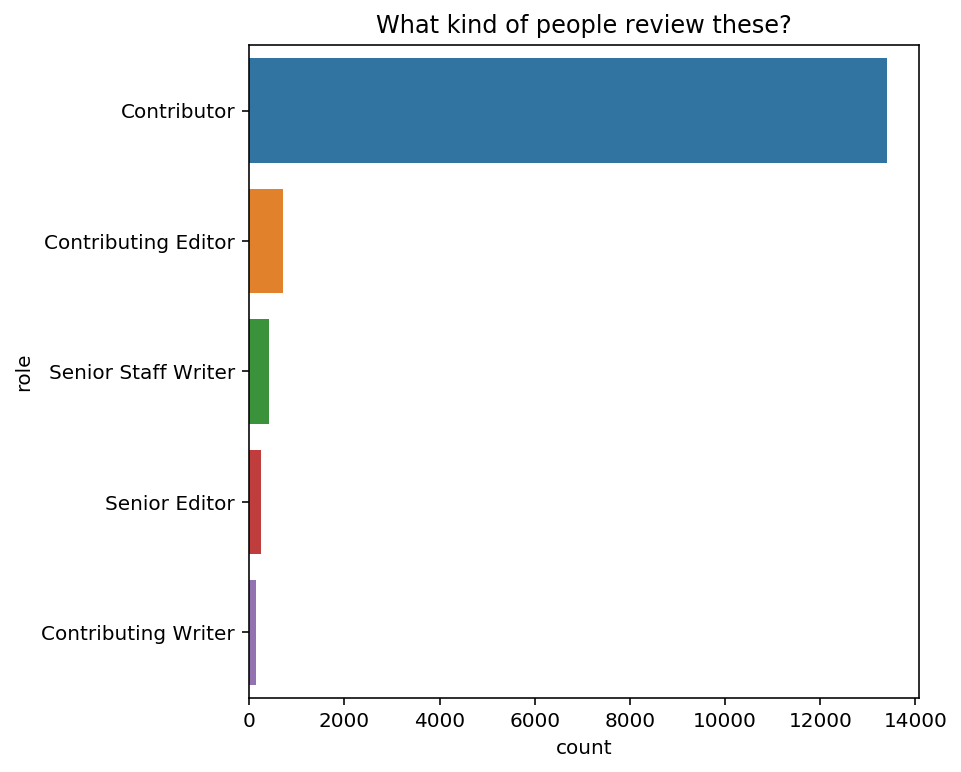

In [43]:
plt.figure(figsize=(6,6))
ax = sns.countplot(y='role', data=droppednan,
                   order=pd.value_counts(droppednan['role']).iloc[:5].index)
ax.set_title('What kind of people review these?');

Based on the look of the graph, it seems that most reviews are submitted by contributors which is not clearly defined as what is considered as contributor. More importantly, is this credible considering that most contributors do so on a volunteer basis? One should proceed with caution on this one.

### Sample output of a text feature extraction

Our method for text analysis is to incoorpate a positivity score that would allow us to see if there are any correlations between whether if positive album reviews affect the performance of artists' songs in the Billboard top 200. Below is an example of a sentence extraction.

In [44]:
sentences=sent_tokenize(reviews_data.iloc[0,9])

In [45]:
for sentence in sentences:
     print(sentence)
     ss = sid.polarity_scores(sentence)
     for k in sorted(ss):
         print('{0}: {1}, '.format(k, ss[k]), end='')
     print()

Viva Brother, Terris, Mansun, the Twang, Joe Lean & the Jing Jang Jong—all decidedly non-legacy acts that the NME has historically (and hysterically) hyperbolized during its nearly seven decade run.
compound: -0.5904, neg: 0.12, neu: 0.88, pos: 0.0, 
So leave it to the ever-clever David Byrne to grab a Niagara-Falls-of-a-gusher pull-quote from an NME live review and emblazon it on his new EP, complete with attribution.
compound: -0.6515, neg: 0.176, neu: 0.824, pos: 0.0, 
Byrne’s long legacy means he’s already responsible for one of the great live albums of the punk era as well as one of the best concert films of all time, and even the concert bootlegs are rightly revered.
compound: 0.9432, neg: 0.0, neu: 0.673, pos: 0.327, 
But Byrne is that rare legacy artist careful not to cash in on his longevity, avoiding all talk of Talking Heads reunions and constantly challenging himself with collaborations—be it St. Vincent or Fatboy Slim—while continuing to chase passions both old and new dow

### Assigning a score
Due to the majority of sentences being categorized as neutral, we decided to take the compound score instead to assign whether a sentence is neutral, positive or negative.

The Compound score is the normalized score between -1 and 1 (most negative to most positive) with the given categorization based on range:

Positive: A score above 0.05

Netural: Inbetween -0.05 and 0.05

Negative: Less than -0.05

Once the scores are assigned, we took the cumulative frequency of all classifications and assigned the proportion of the sentences of the album review.

Source: https://medium.com/analytics-vidhya/simplifying-social-media-sentiment-analysis-using-vader-in-python-f9e6ec6fc52f

In [46]:
for i in range(len(name_album)-1):
    aword=word_count(subreview[i+1])
    sentences=sent_tokenize(subreview[i+1])
    a=get_comp(sentences)
    b=assign_pos(a)
    c=assign_percent(b)
    e={'album2':[name_album[i+1]],'pos':c[0],'neu':c[1],'neg':c[2]
      ,'Wordcount':aword,'score':reviewscore[i+1]}
    add=pd.DataFrame(data=e)
    score_df=pd.concat([score_df,add])

In [47]:
score_df.head(10) #This can be sorted by positivity and negativity too

,album2,pos,neu,neg,Wordcount,score
0,“…The Best Live Show of All Time” — NME EP,0.218750,0.531250,0.250000,295,5.5
0,Lost Lovesongs / Lostsongs Vol. 2,0.242424,0.560606,0.196970,573,6.2
0,Roman Birds,0.363636,0.545455,0.090909,345,7.9
0,Transportation EPs,0.258065,0.612903,0.129032,361,7.8
0,Sick Boy,0.212766,0.531915,0.255319,490,3.1
0,Shadows of Death and Desire,0.150000,0.550000,0.300000,429,7.8
0,Hoodie SZN,0.238095,0.547619,0.214286,380,6.8
0,V I S C 0 9,0.350000,0.575000,0.075000,338,7.3
0,"Ménage à Trois: Sextape Vol. 1, 2, 3",0.262295,0.622951,0.114754,477,7.4
0,Starter Home,0.146341,0.560976,0.292683,303,7.7


### Does textual evidence correlate with performance?

In some cases, a review can help or hurt performance of certain products and we want to know if we should incorporate these into our models.

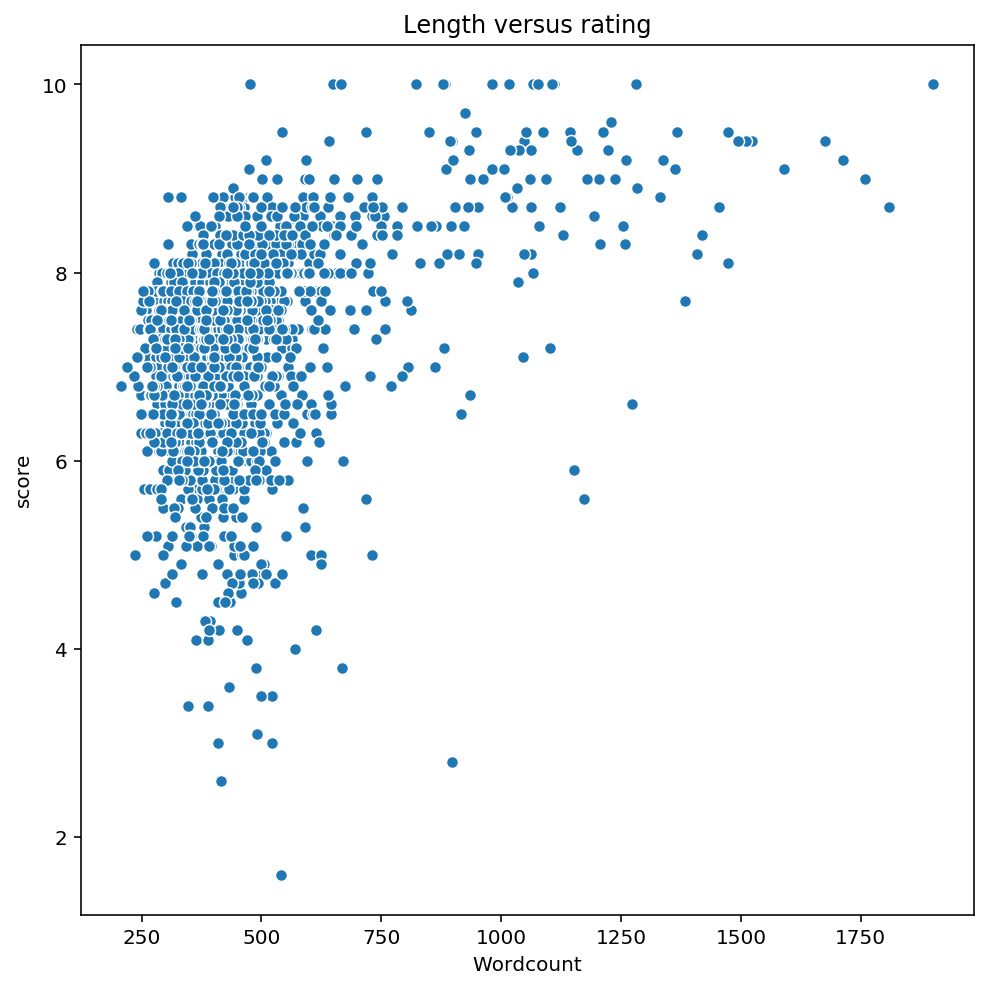

In [48]:
plt.figure(figsize=(8,8))
plt.title('Length versus rating')
plt.xlabel('Review Word Count')
sns.scatterplot(score_df['Wordcount'],score_df['score']);

We noticed a quadratic trend with wordcount and score but logically this makes sense as individuals usually tend to very satisfied with their product to write extensive reviews. What about other scores such as positivity and negativity sentiments?

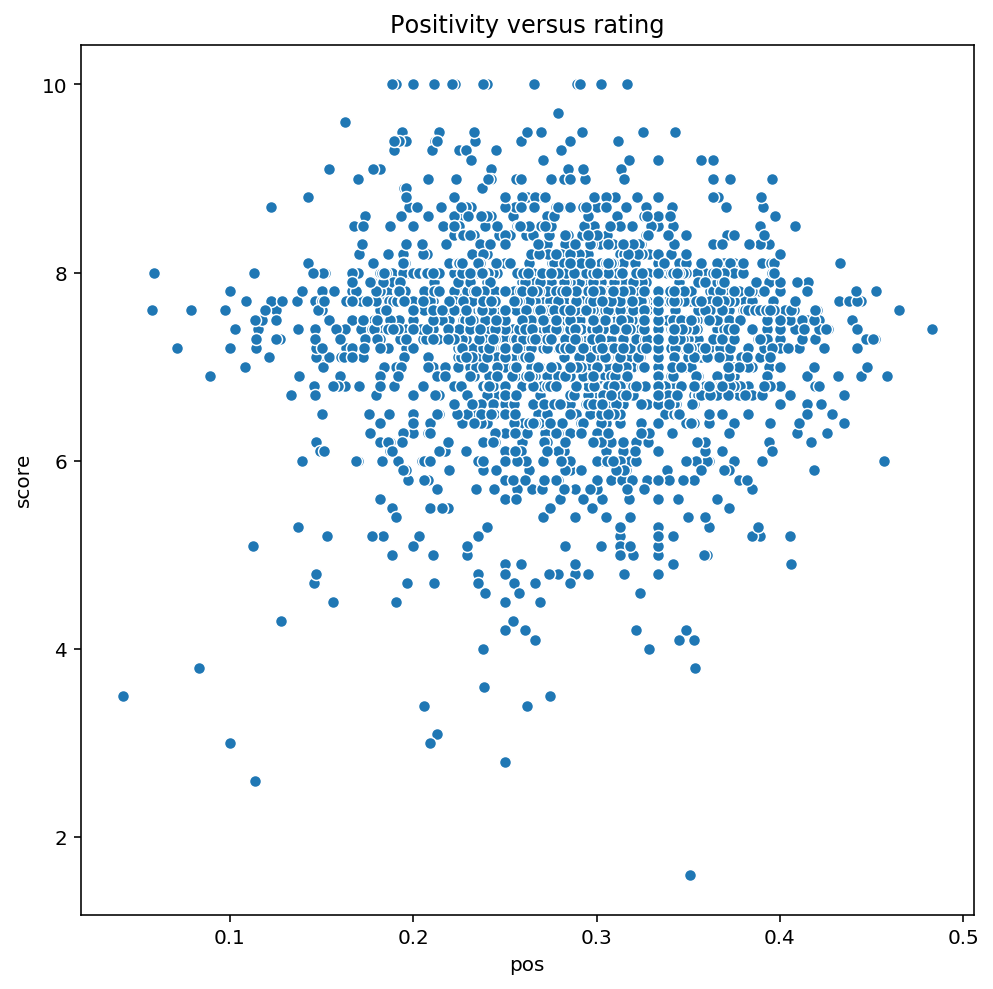

In [49]:
plt.figure(figsize=(8,8))
plt.title('Positivity versus rating')
plt.xlabel('Review Word Count')
sns.scatterplot(score_df['pos'],score_df['score']);

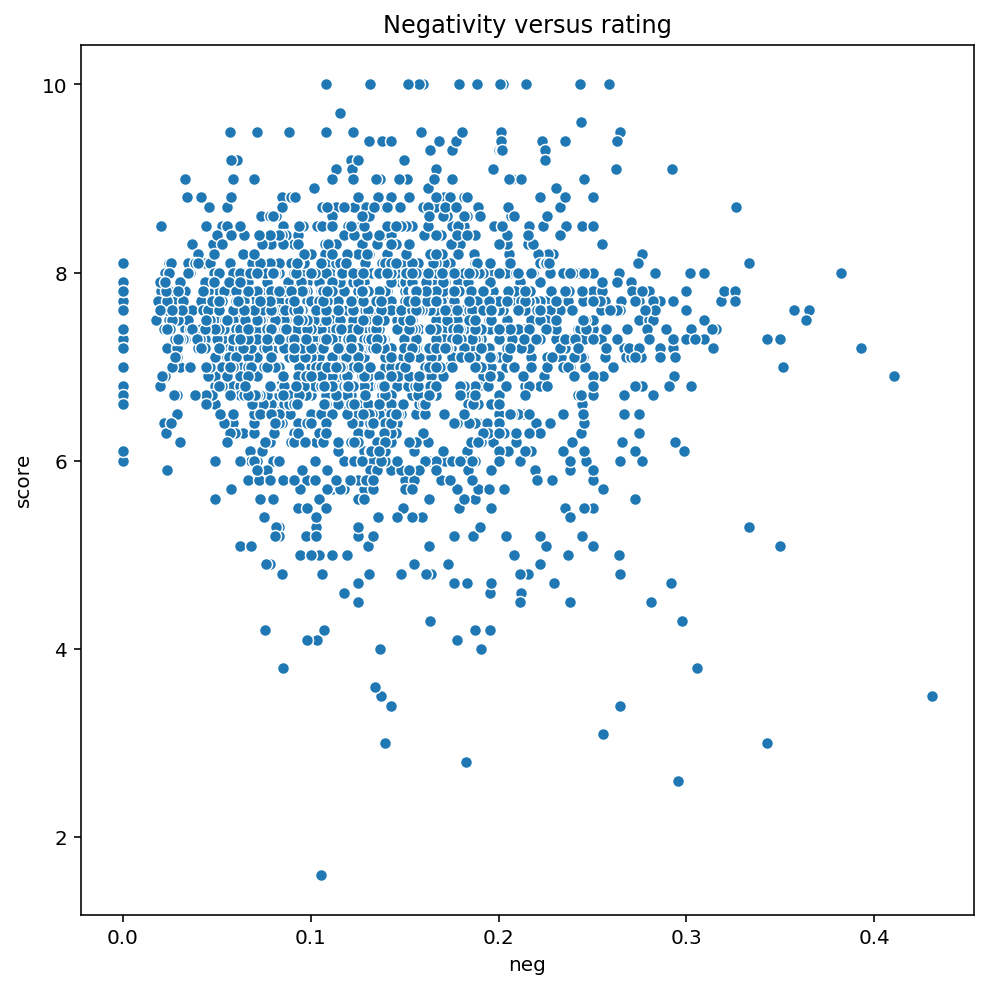

In [50]:
plt.figure(figsize=(8,8))
plt.title('Negativity versus rating')
plt.xlabel('Review Word Count')
sns.scatterplot(score_df['neg'],score_df['score']);

Based on observations of the positivity and negativity, there appears to be no correlation relative to score so we decided to exclude them in our features for model building. Should better methods exist for sentiment analysis, we hope to do additional analysis to incorporate into our model.

### Conclusion: Within our knowledge of text analysis, critic reviews did not provide further information in determining music's popularity but some interesting trends were discovered.

## Feature correlations

We're curious to see if any of the features are correlated with each other so we decided to do some easily interpretable ones based on common assumptions between moods such as happiness and dancability.

In [51]:
x=top_songs_merged['danceability'].values
y=top_songs_merged['valence'].values

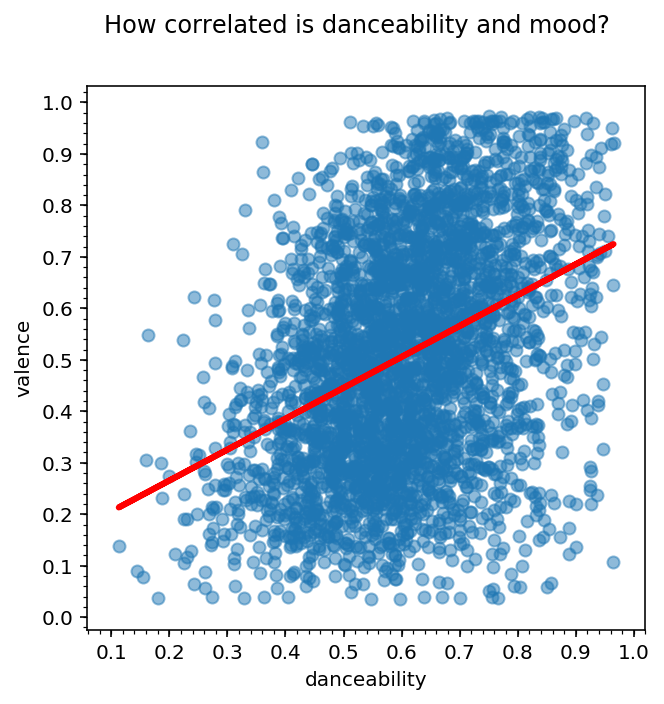

In [52]:
x=x.reshape(x.shape[0],1) #Vectorize the X set to make it easier
y=y.reshape(x.shape[0],1)

regr=linear_model.LinearRegression()
regr.fit(x,y)

fig=plt.figure(figsize=(5,5))
fig.suptitle('How correlated is danceability and mood?')
ax = plt.subplot(1, 1, 1)
ax.scatter(x, y, alpha=0.5)
ax.plot(x, regr.predict(x), color="red", linewidth=3)
plt.xticks(())
plt.yticks(())

ax.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.02))

ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.02))

plt.xlabel("danceability")
plt.ylabel("valence")

plt.show()

This plot shows how correlated it is between the two features. From the looks of it, it does not seem to be able to clearly distinguish between the two traits so lets try a heat map instead.

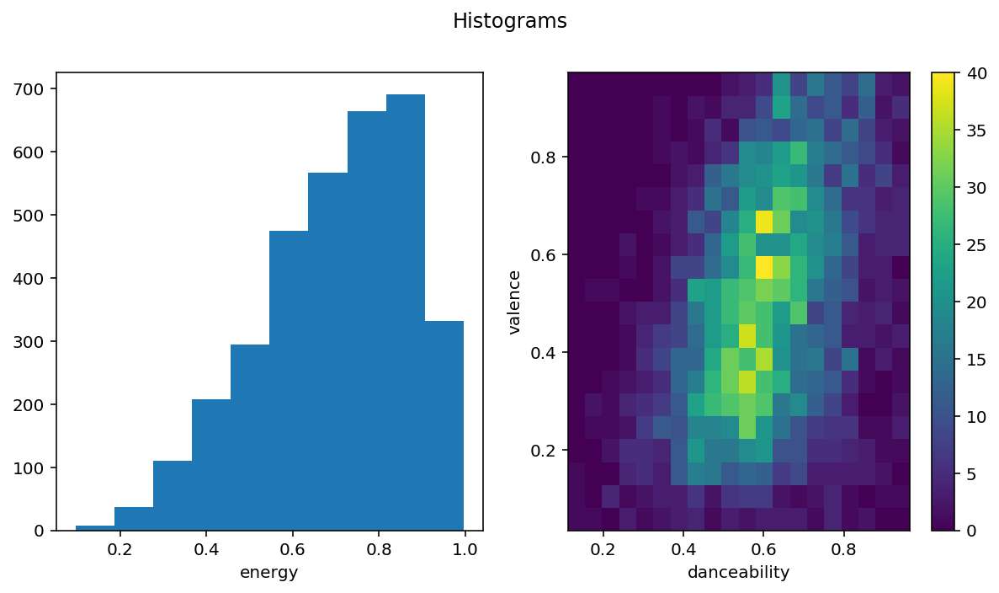

In [53]:
x = "danceability"
y = "valence"

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False, sharex=False, figsize=(10, 5))
fig.suptitle("Histograms")
h = ax2.hist2d(top_songs_merged[x], top_songs_merged[y], bins=20)
ax1.hist(top_songs_merged["energy"])

ax2.set_xlabel(x)
ax2.set_ylabel(y)

ax1.set_xlabel("energy")

plt.colorbar(h[3], ax=ax2)

plt.show()

From this graph, it seems that top songs generally have high energy and also have a good correlation between the two characteristics. How about for other features?

In [54]:
allfeat=['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence']
relevant=['acousticness','danceability','energy','instrumentalness',
          'liveness','loudness','speechiness','tempo','valence']
chosen = ["energy", "liveness", "tempo", "valence"]

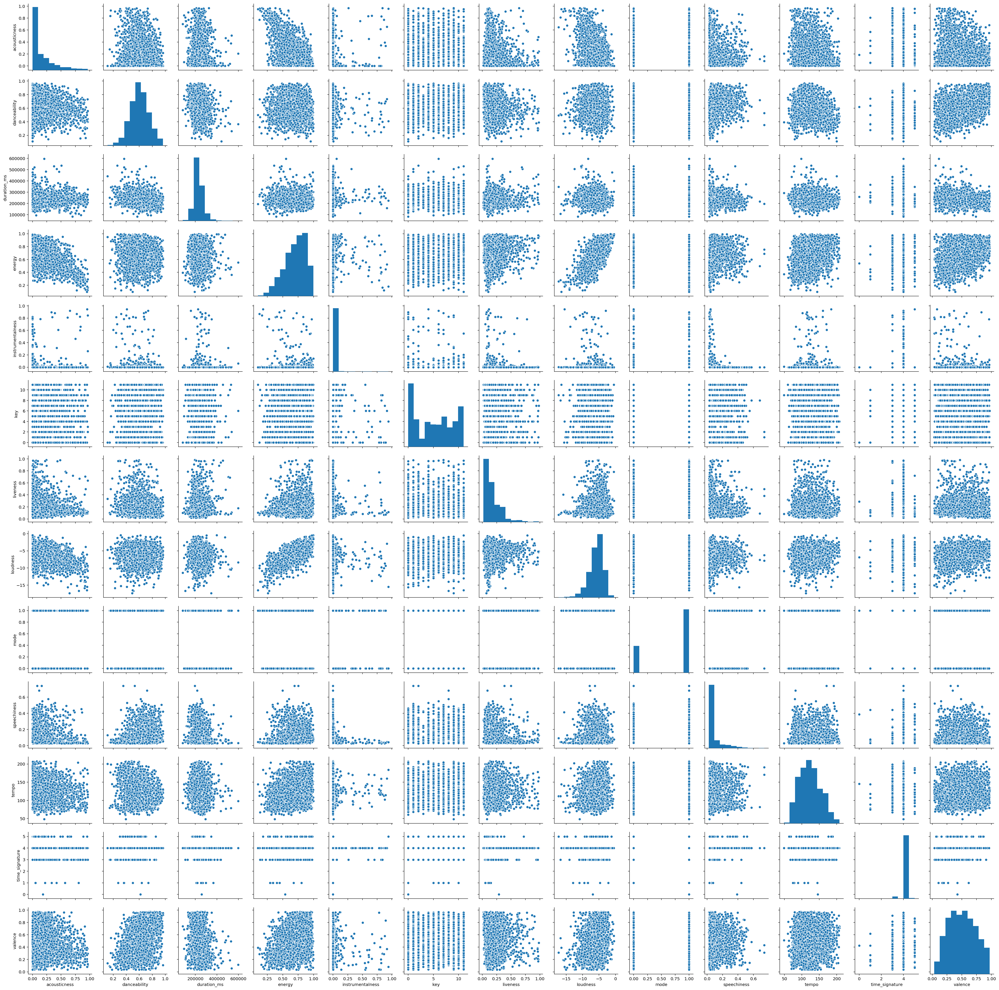

In [55]:
sns.pairplot(top_songs_merged[allfeat]);
#Feel free to pick smaller ones

Since there are numerous features, perhaps this might not be the best way to understand our features and a numerical method should be used instead.

# Numerical Correlation

In [56]:
features=list(acoustic_data_norepeat.columns)[5:18]
# Get rid of NA observations
acoustic_dataDropNa = acoustic_data_norepeat.dropna()
x=acoustic_dataDropNa[features].values

threshold = .5
def color_thresh_red(val):
    """Takes a scalar and returns a string with 'color: red' 
    for values greater than the threshold, black otherwise."""
    color = 'red' if (abs(val) > threshold) else 'black'
    return 'color: %s' % color    
        

dfCorr = acoustic_dataDropNa.loc[:,features].corr()
dfCorr.style.applymap(color_thresh_red)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
acousticness,1,-0.193068,-0.119952,-0.706325,0.117487,-0.0235646,-0.00397746,-0.565654,0.0802602,0.0100406,-0.175962,-0.186037,-0.215818
danceability,-0.193068,1,-0.0593736,0.10646,-0.191167,0.0232822,-0.15263,0.146065,-0.0701762,0.175679,-0.111368,0.203681,0.526791
duration_ms,-0.119952,-0.0593736,1,0.0673131,0.0435888,0.00505697,0.0665745,0.0461941,-0.0470242,-0.0799164,0.0193024,0.0612162,-0.122502
energy,-0.706325,0.10646,0.0673131,1,-0.119356,0.0306077,0.167011,0.760038,-0.0673965,0.0997287,0.214415,0.190937,0.309319
instrumentalness,0.117487,-0.191167,0.0435888,-0.119356,1,-0.00778264,-0.0361246,-0.276654,-0.0390986,-0.108777,-0.0227295,-0.0463808,-0.157214
key,-0.0235646,0.0232822,0.00505697,0.0306077,-0.00778264,1,-0.000811978,0.0171282,-0.163815,0.0320881,-0.00276092,0.00658347,0.0271169
liveness,-0.00397746,-0.15263,0.0665745,0.167011,-0.0361246,-0.000811978,1,0.0427765,0.0112383,0.221051,0.00225211,-0.0141454,-0.0267157
loudness,-0.565654,0.146065,0.0461941,0.760038,-0.276654,0.0171282,0.0427765,1,-0.0300511,-0.00292515,0.171675,0.168147,0.17803
mode,0.0802602,-0.0701762,-0.0470242,-0.0673965,-0.0390986,-0.163815,0.0112383,-0.0300511,1,-0.0843688,0.0151926,-0.0161918,-0.000495447
speechiness,0.0100406,0.175679,-0.0799164,0.0997287,-0.108777,0.0320881,0.221051,-0.00292515,-0.0843688,1,-0.0321391,-0.00741036,0.0494928


# Clustering

In [57]:
# Choose interpretable factors
clusterFeatures = ["acousticness", "danceability", "energy", "instrumentalness","valence", "speechiness" ]
df_recent = acoustic_data_norepeat.dropna()

# Just do data in the 2000s
df_recent= df_recent[(df_recent['date'] >= '2000-01-01')]
df_recent = df_recent[(df_recent['date'] <= '2019-01-01')]
df_recent.head()
df_recent = df_recent[clusterFeatures]

aCluster = df_recent.loc[:,clusterFeatures].values

In [58]:
# Source https://github.com/jkwd/spotify/blob/master/Code/Favourite%20songs%20EDA.ipynb

# Standardize and scale the data sincethe scale of each of the attributes is vastly different
scaler = StandardScaler()
scaler.fit(aCluster)
X = scaler.transform(aCluster)

When trying to cluster song attributes, we are essentially trying to create genres of music. Because of this goal, we want to only use interpretable factors, while also trying to minimize the total amount of variables. We decided to keep the following variables: "acousticness", "danceability", "energy", "instrumentalness","valence", and "speechiness". 

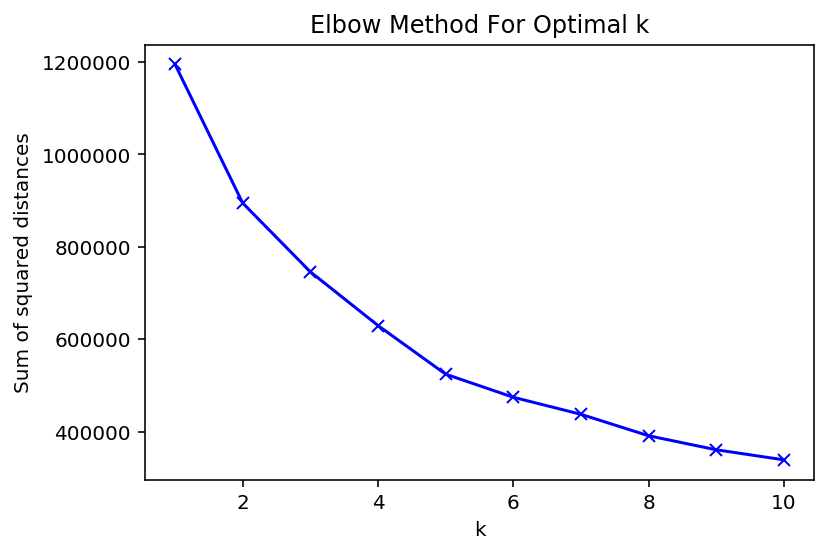

In [59]:
from sklearn.cluster import KMeans

ss_dist = []

# We iterate over 1-10 clusters since there are around 10 generally accepted genres
K = range(1, 11)
for k in K:
    km = KMeans(n_clusters=k, max_iter=10000, init='k-means++', random_state=123)
    km = km.fit(X)
    ss_dist.append(km.inertia_)

plt.plot(K, ss_dist, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

We decided to use the K-means clustering algorithm to optimize the number of clusters and the sum of squared distances (SSD) between each point and its centroid. Using the elbow method, we look at the SSD for each of the cluster amounts. To look for the optimal cluster amount, we want to find the point where increasing the cluster amount will lead to only a small decrease in SSD. At this point, it would look like the point of a human arm where the'elbow' bends. 

In [60]:
ss_distNP = np.array(ss_dist)

# The marginal SSD decrease for adding an extra cluster
data = {'Cluster':list(range(1,10)), 'Marginal % SSD Decrease':((ss_distNP[0:9] - ss_distNP[1:10])/(ss_distNP[0:9]))}
pd.DataFrame(data).set_index('Cluster')

,Marginal % SSD Decrease
Cluster,
1,0.251188
2,0.166215
3,0.155806
4,0.167280
5,0.095246
6,0.077778
7,0.106090
8,0.077600
9,0.060405


From looking at both the marginal percentage decreases in SSD and generally accpted amount of music genres, it seems like the best choice for a k value is either 5 or 6. We can see this visually, as at these points the graph appears to make an 'elbow' or numerically as going from 4 to 5 decreases SSD by 16.7%, while going from 5 to 6 will decrease only by 9.5%. Since neither point was significantly better, we decided to have 6 clusters, since having 5 genres wouldn't allow as much genre discrimination.

In [61]:
num_clusters = 6
kmeanModel = KMeans(n_clusters=num_clusters, max_iter=10000, init='k-means++', random_state=123).fit(X)

df_recent.loc[:,'cluster'] = kmeanModel.labels_

# calculate mean of each variable
radar_col = clusterFeatures + ['cluster']

# feature average for each cluster as a radar chart
df_radar = df_recent[radar_col]
df_radar = df_radar.groupby('cluster').mean().reset_index()

In [62]:
clusNum = 1 # Can choose which cluster to look at ie. {0, 1, 2, 3, 4, 5}
df_recent = acoustic_data_norepeat.dropna()
aff = df_recent[((df_recent['date'] >= '2000-01-01')&(df_recent['date'] <= '2019-01-01'))]

aff.loc[:,'cluster'] = kmeanModel.labels_
aff[aff.cluster == clusNum].head()

,index,id,song,album,artist,acousticness,danceability,duration_ms,energy,instrumentalness,...,liveness,loudness,mode,speechiness,tempo,time_signature,valence,album_id,date,cluster
82153,82153,0KZcl8OtE3tvE0tHJHOoeR,Ég anda,Valtari,Sigur Ros,0.751,0.102,375027.0,0.3160,0.948,...,0.1760,-11.085,1.0,0.0376,83.396,3.0,0.0297,0ZHkshyLAi9f8DXdj3Z5ph,2012-05-23,1
124865,124865,4O94lc0TZiFr9aU24zQ9LT,Ára bátur,Med Sud I Eyrum Vid Spilum Endalaust,Sigur Ros,0.959,0.204,536907.0,0.0783,0.339,...,0.0702,-15.066,1.0,0.0383,58.217,4.0,0.0903,5CtxgcqieOcYKyQjGKI0nY,2008-06-23,1
26702,26702,2lTYm68ujleUaTbIzm2LqZ,¿Qué Alboroto? - Live,Paloma Negra Desde Monterrey,Jenni Rivera,0.699,0.131,57693.0,0.3740,0.881,...,0.7580,-13.556,1.0,0.0793,167.619,4.0,0.0370,57chwFarxKCzWhzw2yoYbd,2016-09-30,1
15947,15947,0baNzeUcPQnQSagpe8T0mD,worldstar money (interlude),In Tongues (EP),Joji,0.964,0.577,126312.0,0.3870,0.706,...,0.2080,-8.607,1.0,0.2740,146.565,1.0,0.4590,6ZksrxRWlJ7ExylPyJwfLJ,2018-02-14,1
66278,66278,1BNJmdPhNojCQCk1rpKbg2,where the sky breaks,Collapse,Dangerkids,0.112,0.138,46973.0,0.1880,0.979,...,0.1090,-14.243,0.0,0.0381,141.729,4.0,0.0397,5ySvLFveZH9nuZgBsHH8Pt,2013-09-16,1


In [63]:
# https://python-graph-gallery.com/392-use-faceting-for-radar-chart/
from math import pi, ceil

def make_radar(row, title, color, dframe, num_clusters):
    # number of variable
    categories=list(dframe)[1:]
    N = len(categories)
    
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    # Initialise the radar plot
    ax = plt.subplot(2,ceil(num_clusters/2),row+1, polar=True, )
    
    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=14)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.2,0.4,0.6,0.8], ["0.2","0.4","0.6","0.8"], color="grey", size=8)
    plt.ylim(0,1)

    # Ind1
    values=dframe.loc[row].drop('cluster').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=16, color=color, y=1.06)

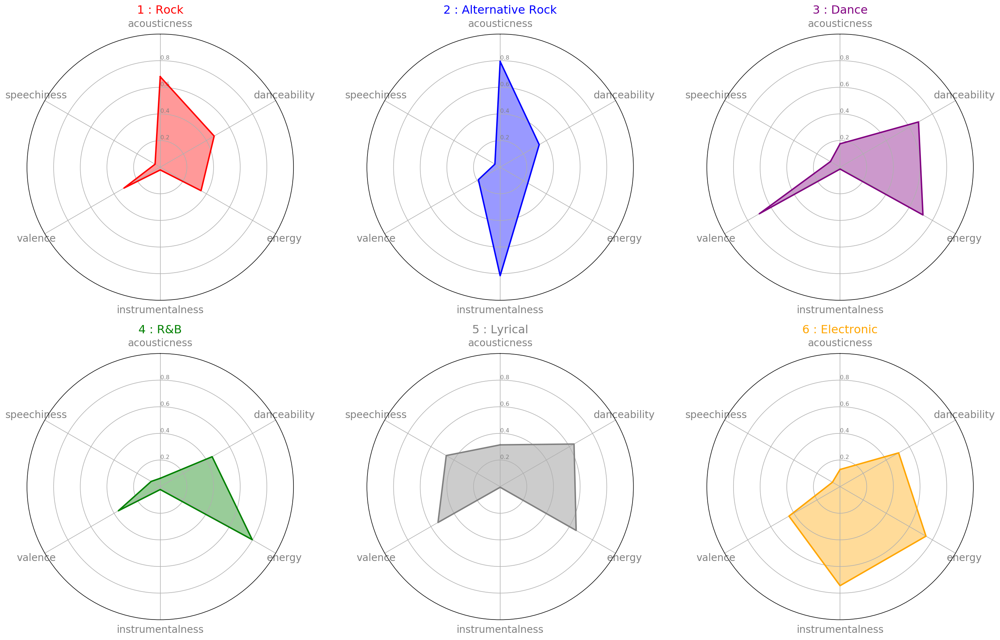

In [64]:
# initialize the figure
plt.figure(figsize=(24,15))
 
# Create a color palette:
my_palette = ['red', 'blue', 'purple', 'green', 'grey', 'orange']

# Create cluster name
title_list = ['Rock', 'Alternative Rock', 'Dance', 'R&B', 'Lyrical', 'Electronic']

# Loop to plot
for row in range(0, len(df_radar.index)):
    make_radar(row=row, title=str(1+df_radar['cluster'][row]) + ' : ' + title_list[row], 
               color=my_palette[row], dframe=df_radar, num_clusters=len(df_radar.index))

    
# Show plot
plt.show()

The above graph shows the average attributes of all the songs within each cluster. We made labels describing the qualities that we see from the clusters, which would intuitively describe genres. Some of the graphs have overlapping qualities, such as the first 2 clusters. This makes it somewhat difficult to distinguish particular genres. 

In [65]:
!pip install imblearn

In [66]:
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import statsmodels.api as sm
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.linear_model import Lasso


# Models and Data Balancing

Upon first observation and calculation, we noticed there is a huge class imbalance of the proportion of "hit" and "not hit" songs from our classification. Thus we took additional step to correct for this problem. The method we decided to use is SMOTE: Synthetic Minority Over-Sampling Technique, which creates synthetic data point to compensate the under sampling. We also used three modeling methods: 

1) K-Nearest Neighbors (KNN)

2) Logistic regression

3) Random Forest. 

KNN was used as a basis for an unsupervised method as we want to see how the model would perform without many information given. The Logistic regression was used for ease of interpretability as it handles binary classification very well and can be further improved into lasso and ridge regression. Random forest was used for combining decision trees as well as different sampling methodologies for an optimal performance. However, the consequence of using random forest is what some would determine as a "Black-box algorthim", lack of interpretability and processing speed as we noticed during fine tuning.

In [67]:
#Make sure to look at the later values instead
top_songs_merged['hit'] = 1
acoustic_data_norepeat['Hit'] = 0
dataset = pd.merge(top_songs_merged,acoustic_data_norepeat, how = 'right',right_on=['song','artist'],left_on=['Song','Performer'])
dataset['Hit'] = dataset['hit'] + dataset['Hit']
dataset.loc[dataset.Hit!= 1.0, 'Hit'] = 0
dataset.Hit = dataset.Hit.astype(int)
dataset[dataset['Hit'] == 0].head(5)

,Week Position,Song,Performer,Instance,Previous Week Position,Peak Position,Weeks on Chart,song_x,album_x,acousticness_x,...,liveness_y,loudness_y,mode_y,speechiness_y,tempo_y,time_signature_y,valence_y,album_id,date,Hit
3332,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.1030,-3.967,0.0,0.0985,113.937,4.0,0.512,3KrFO9QDgfa4UAiqM6flTf,2018-01-23,0
3333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.2470,-4.673,1.0,0.2330,178.998,4.0,0.618,1bJ8O4jIyqSdunqT9RWXc9,2018-03-02,0
3334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0875,-3.846,1.0,0.0423,99.872,4.0,0.367,3KrFO9QDgfa4UAiqM6flTf,2018-01-23,0
3335,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.2690,-5.814,1.0,0.2650,129.992,4.0,0.590,7K8twkW7PyQJKbLVREH3PW,2013-11-05,0
3336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.1470,-1.585,1.0,0.0723,129.766,4.0,0.958,6dCsrXRW9GqW1N1Vwk2dMC,2011-06-29,0


In [68]:
dataset.columns.values
dataset = dataset[[
       'acousticness_y', 'danceability_y', 'duration_ms_y', 'energy_y',
       'instrumentalness_y', 'key_y', 'liveness_y', 'loudness_y',
       'mode_y', 'speechiness_y', 'tempo_y', 'time_signature_y',
       'valence_y', 'Hit']]
dataset['Hit'].value_counts()
#dataset['Hit'].value_counts(normalize=True)

0    322018
1      3332
Name: Hit, dtype: int64

In [69]:
dataset = dataset.dropna()

In [70]:
x = dataset.loc[:, dataset.columns != 'Hit']
feature_list = x.columns.values.tolist()
print(feature_list)
#should we transform
y = dataset.loc[:, dataset.columns == 'Hit']

['acousticness_y', 'danceability_y', 'duration_ms_y', 'energy_y', 'instrumentalness_y', 'key_y', 'liveness_y', 'loudness_y', 'mode_y', 'speechiness_y', 'tempo_y', 'time_signature_y', 'valence_y']


In [71]:
import sklearn.model_selection
from sklearn.model_selection import train_test_split
import imblearn
from imblearn.over_sampling import SMOTE

In [72]:
x_train_im, x_test_im, y_train_im, y_test_im = train_test_split(x, y, random_state = 15)
print ("Imbalanced Audio Features Training Set:", x_train_im.shape, "Imbalanced Audio Features Testing Set:", x_test_im.shape)
print ("Imbalanced Result Training Set:", y_train_im.shape, "Imbalanced Result Testing Set:", y_test_im.shape)


Imbalanced Audio Features Training Set: (244008, 13) Imbalanced Audio Features Testing Set: (81337, 13)
Imbalanced Result Training Set: (244008, 1) Imbalanced Result Testing Set: (81337, 1)


In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, classification_report, confusion_matrix,
                             roc_auc_score, roc_curve, matthews_corrcoef, log_loss,
                             mean_squared_error, auc)
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

## Calculating on Imbalanced Data

In [74]:
# ROC for imbalanced K Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(x_train_im, y_train_im)
y_pred_knn_im = knn.predict(x_test_im)
y_pred_prob_knn_im = knn.predict_proba(x_test_im)[:,1]
knn_im_roc = roc_auc_score(y_test_im, y_pred_prob_knn_im)

# ROC for imbalanced Logistic Regression
logreg = LogisticRegression()
logreg.fit(x_train_im, y_train_im)
y_pred_logreg_im = logreg.predict(x_test_im)
y_pred_prob_logreg_im = logreg.predict_proba(x_test_im)[:,1]
logreg_im_roc = roc_auc_score(y_test_im, y_pred_prob_logreg_im)

# ROC for imbalanced Random Forest
rf = RandomForestClassifier()
rf.fit(x_train_im, y_train_im)
y_pred_rf_im = rf.predict(x_test_im)
y_pred_prob_rf_im = rf.predict_proba(x_test_im)[:,1]
rf_im_roc = roc_auc_score(y_test_im, y_pred_prob_rf_im)

In [75]:
print(knn_im_roc)
print(logreg_im_roc)
print(rf_im_roc)

0.5150449600955318
0.48884275396134796
0.5824902180409136


In [76]:
#define a majority class (Not Hit Songs) and a minority class (Hit Songs)
df_majority = dataset[dataset.Hit == 0]
df_minority = dataset[dataset.Hit == 1]

#upsample minority class
df_minority_up = resample(df_minority, replace=True, n_samples=322013, random_state=15)
#make sure resampling is done right

#create new combination with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_up])

df_upsampled.head()
print(df_upsampled.Hit.value_counts())

x_re = df_upsampled.loc[:, df_upsampled.columns != 'Hit']
y_re = df_upsampled.loc[:, df_upsampled.columns == 'Hit']

1    322013
0    322013
Name: Hit, dtype: int64


In [77]:
x_train, x_test, y_train, y_test = train_test_split(x_re, y_re, random_state=15)
print ("Resampled Audio Features Training Set:", x_train.shape, "Resampled Audio Features Testing Set:", x_test.shape)
print ("Resampled Result Training Set:", y_train.shape, "Resampled Result Testing Set:", y_test.shape)

Resampled Audio Features Training Set: (483019, 13) Resampled Audio Features Testing Set: (161007, 13)
Resampled Result Training Set: (483019, 1) Resampled Result Testing Set: (161007, 1)


In [78]:
sm = SMOTE(ratio="auto", kind="regular")
x_smote , y_smote = sm.fit_sample(x,y)

In [79]:
x_train_sm, x_test_sm, y_train_sm, y_test_sm = train_test_split(x_smote, y_smote, random_state=15)
print ("SMOTE Audio Features Training Set:", x_train_sm.shape, "SMOTE Audio Features Testing Set:", x_test_sm.shape)
print ("SMOTE Result Training Set:", y_train_sm.shape, "SMOTE Result Testing Set:", y_test_sm.shape)

y_train_sm

SMOTE Audio Features Training Set: (483019, 13) SMOTE Audio Features Testing Set: (161007, 13)
SMOTE Result Training Set: (483019,) SMOTE Result Testing Set: (161007,)


array([1, 0, 0, ..., 1, 0, 1])

# Principal Component Analysis (PCA)

PCA was used to see if we are able to reduce the number of dimensions of our dataset and help improve our processing speed and accuracy.

In [80]:
#PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Fit on training set only.
scaler.fit(x_train_sm)

# Apply transform to both the training set and the test set.
x_train_pca = scaler.transform(x_train_sm)
x_test_pca = scaler.transform(x_test_sm)

from sklearn.decomposition import PCA
pca = PCA(.95)
pca.fit(x_train_pca)
pca.n_components_

x_train_pca = pca.transform(x_train_pca)
x_test_pca= pca.transform(x_test_pca)

print(pca.n_components_)

11


array([0.21712608, 0.11679152, 0.09677048, 0.08868568, 0.07830367,
       0.07421065, 0.06811294, 0.06676182, 0.06224209, 0.05546653,
       0.03437251])

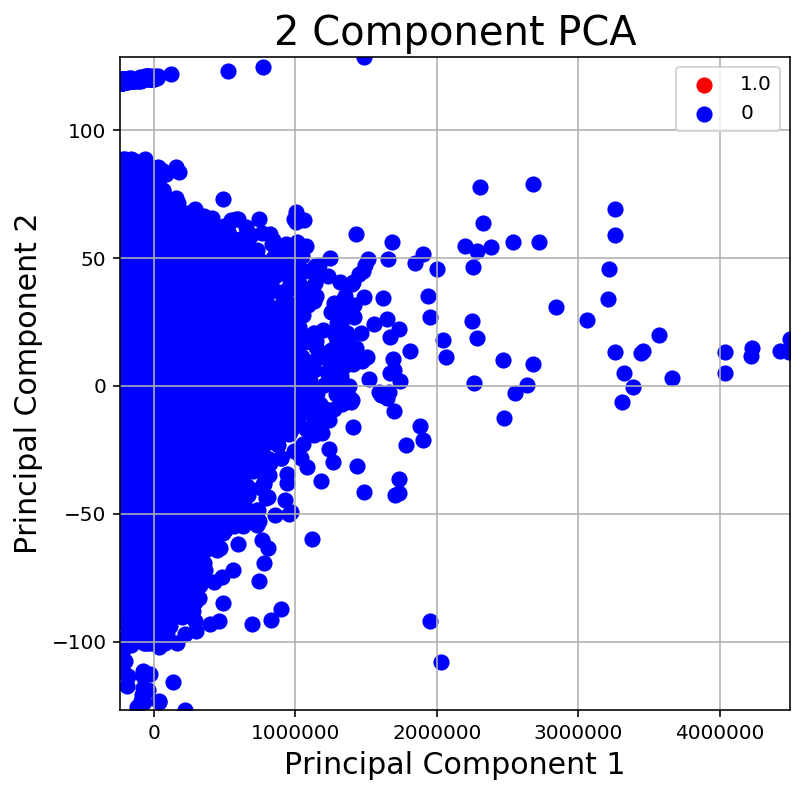

In [81]:
#source https://github.com/mGalarnyk/Python_Tutorials/blob/master/Sklearn/PCA/PCA_Data_Visualization_Iris_Dataset_Blog.ipynb
x_pca = StandardScaler().fit_transform(x)
pcav2 = PCA(n_components=2)
principalComponents = pcav2.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, dataset[['Hit']]], axis = 1)
finalDf.head(5)

fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)

targets = [1.0,0]
colors = ['r', 'b']
#targets = [1.0]
#colors = ['r']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Hit'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.set_xlim(-235643.785117, 4.497373e+06)
ax.set_ylim(-126.573642,1.284407e+02)
ax.grid()
ax.get_ylim()

pca.explained_variance_ratio_


The hit songs are not visible on the graph because they are covered by the not hit songs. We would have liked to see two easily separated clumps, but that is not the case. We graph just the hit songs below for visualization purposes. 

array([0.21712608, 0.11679152, 0.09677048, 0.08868568, 0.07830367,
       0.07421065, 0.06811294, 0.06676182, 0.06224209, 0.05546653,
       0.03437251])

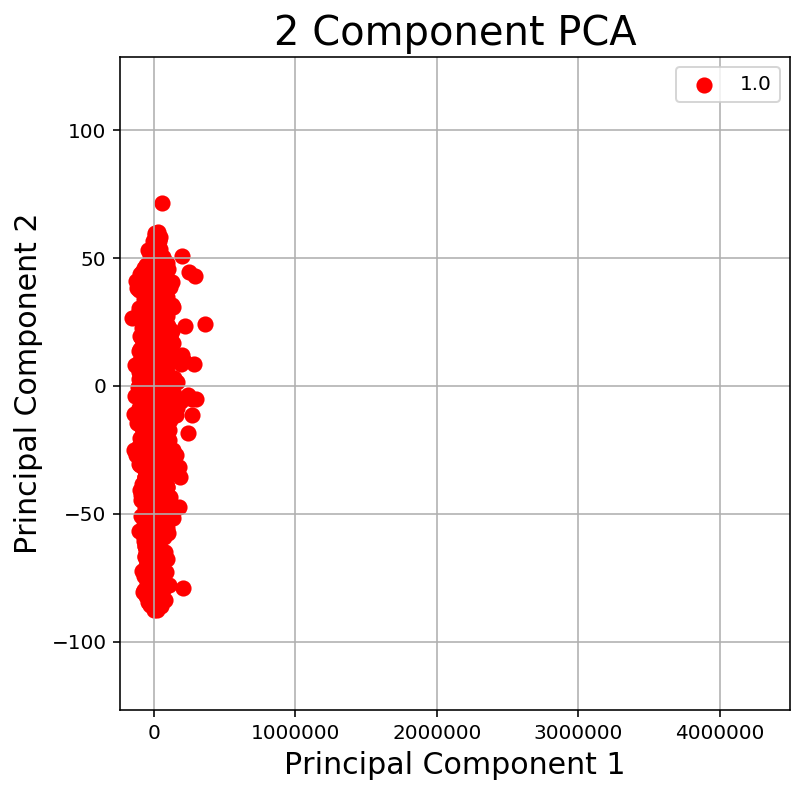

In [82]:
x_pca = StandardScaler().fit_transform(x)
pcav2 = PCA(n_components=2)
principalComponents = pcav2.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, dataset[['Hit']]], axis = 1)
finalDf.head(5)

fig = plt.figure(figsize = (6,6))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)

targets = [1.0]
colors = ['r']
#targets = [1.0]
#colors = ['r']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Hit'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.set_xlim(-235643.785117, 4.497373e+06)
ax.set_ylim(-126.573642,1.284407e+02)
ax.grid()
ax.get_ylim()

pca.explained_variance_ratio_

## Observations

One problem with oversampling a minority class in an imbalanced dataset is you'd end up learning too much of the specific of the few examples, and that wouldn't generalize well. SMOTE is supposed to learn the topological properties of the neighborhood of those points in the minority class, so you are less likely to overfit. This is especially important for our random forest model as random forest can easily overfit.

SMOTE source: https://stats.stackexchange.com/questions/234016/opinions-about-oversampling-in-general-and-the-smote-algorithm-in-particular

In [83]:
# ROC for imbalanced K Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(x_train_im, y_train_im)
y_pred_knn_im = knn.predict(x_test_im)
y_pred_prob_knn_im = knn.predict_proba(x_test_im)[:,1]
knn_im_roc = roc_auc_score(y_test_im, y_pred_prob_knn_im)

# ROC for imbalanced Logistic Regression
logreg = LogisticRegression()
logreg.fit(x_train_im, y_train_im)
y_pred_logreg_im = logreg.predict(x_test_im)
y_pred_prob_logreg_im = logreg.predict_proba(x_test_im)[:,1]
logreg_im_roc = roc_auc_score(y_test_im, y_pred_prob_logreg_im)

# ROC for imbalanced Random Forest
rf = RandomForestClassifier()
rf.fit(x_train_im, y_train_im)
y_pred_rf_im = rf.predict(x_test_im)
y_pred_prob_rf_im = rf.predict_proba(x_test_im)[:,1]
rf_im_roc = roc_auc_score(y_test_im, y_pred_prob_rf_im)

# ROC for resampled K Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
y_pred_knn = knn.predict(x_test)
y_pred_prob_knn = knn.predict_proba(x_test)[:,1]
knn_roc = roc_auc_score(y_test, y_pred_prob_knn)

# ROC for resampled Logistic Regression
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
y_pred_logreg = logreg.predict(x_test)
y_pred_prob_logreg = logreg.predict_proba(x_test)[:,1]
logreg_roc = roc_auc_score(y_test, y_pred_prob_logreg)

# ROC for resampled Random Forest
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
y_pred_rf = rf.predict(x_test)
y_pred_prob_rf = rf.predict_proba(x_test)[:,1]
rf_roc = roc_auc_score(y_test, y_pred_prob_rf)

# ROC for SMOTE K Nearest Neighbors
knn = KNeighborsClassifier()
knn.fit(x_train_sm, y_train_sm)
y_pred_knn_sm = knn.predict(x_test_sm)
y_pred_prob_knn_sm = knn.predict_proba(x_test_sm)[:,1]
knn_sm_roc = roc_auc_score(y_test_sm, y_pred_prob_knn_sm)

# ROC for SMOTE Logistic Regression
logreg = LogisticRegression()
logreg.fit(x_train_sm, y_train_sm)
y_pred_logreg_sm = logreg.predict(x_test_sm)
y_pred_prob_logreg_sm = logreg.predict_proba(x_test_sm)[:,1]
logreg_sm_roc = roc_auc_score(y_test_sm, y_pred_prob_logreg_sm)

# ROC for SMOTE Random Forest
rf = RandomForestClassifier()
rf.fit(x_train_sm, y_train_sm)
y_pred_rf_sm = rf.predict(x_test_sm)
y_pred_prob_rf_sm = rf.predict_proba(x_test_sm)[:,1]
rf_sm_roc = roc_auc_score(y_test_sm, y_pred_prob_rf_sm)

roc = [("k-NN", "{:.2%}".format(knn_im_roc),
        "{:.2%}".format(knn_roc), "{:.2%}".format(knn_sm_roc)),
         ("Logistic Regression", "{:.2%}".format(logreg_im_roc),
          "{:.2%}".format(logreg_roc), "{:.2%}".format(logreg_sm_roc)),
         ("Random Forest", "{:.2%}".format(rf_im_roc),
          "{:.2%}".format(rf_roc), "{:.2%}".format(rf_sm_roc))]

labels = ["Classifier", "Imbalanced", "Resampled", "SMOTE"]
df = pd.DataFrame.from_records(roc, columns=labels)
print (df)


            Classifier Imbalanced Resampled   SMOTE
0                 k-NN     51.50%    99.30%  92.60%
1  Logistic Regression     48.88%    72.42%  74.37%
2        Random Forest     58.75%   100.00%  99.86%


# Modeling ROC Curves

                        AUC Accuracy Precision  Recall
Classifier                                            
k-Nearest Neighbor   92.60%   84.79%    79.86%  92.96%
Logistic Regression  74.37%   69.99%    66.95%  78.73%
Random Forest        99.87%   98.83%    99.13%  98.53%


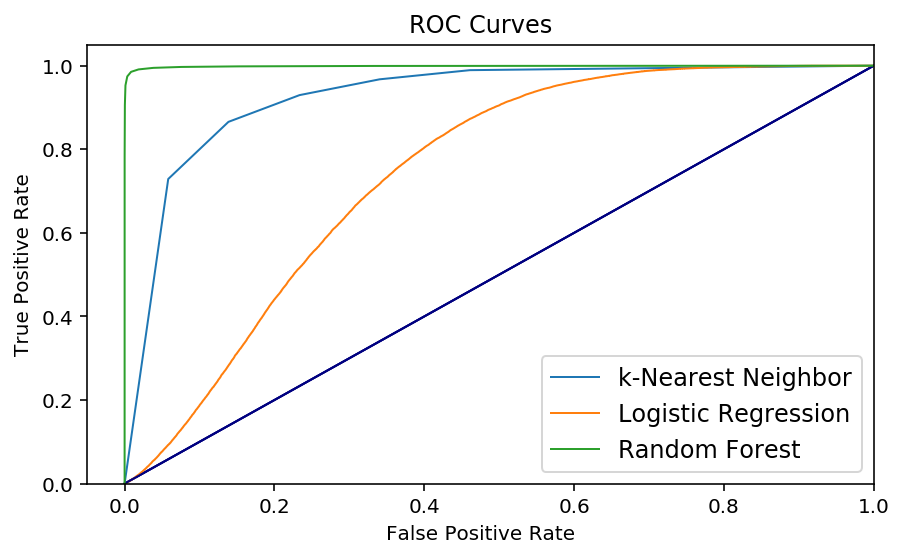

In [84]:
classifiers = [KNeighborsClassifier(), LogisticRegression(), RandomForestClassifier()]
class_label = ["k-Nearest Neighbor", "Logistic Regression", "Random Forest"]
columns = ["Classifier", "AUC", "Accuracy", "Precision", "Recall"]

classif_df = pd.DataFrame(index=[0], columns=columns)
fig = plt.figure(figsize=(12, 4))

for classif in classifiers:

    # fit to training set
    classif.fit(x_train_sm, y_train_sm)

    # predict on testing set
    y_pred = classif.predict(x_test_sm)

    # score accuracy
    acc = accuracy_score(y_test_sm, y_pred)

    # find probabilities
    y_pred_prob = classif.predict_proba(x_test_sm)[:, 1]

    # find ROC curves
    fpr, tpr, thresholds = roc_curve(y_test_sm, y_pred_prob)
    rocauc = roc_auc_score(y_test_sm, y_pred_prob)

    # plot ROC curves
    ax1 = plt.subplot(121)
    plt.plot([0, 1], [0, 1], color= "navy", lw=1)
    plt.plot(fpr, tpr, lw=1, label=class_label[classifiers.index(classif)])
    plt.xlim([-.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves")
    plt.legend(loc= "best", fontsize=12)

    # calculate precision and recall scores
    prscore = precision_score(y_test_sm, classif.predict(x_test_sm))
    recscore = recall_score(y_test_sm, classif.predict(x_test_sm))

    # add scores into dataframe
    classif_df.loc[classifiers.index(classif)] = [class_label[classifiers.index(classif)],
                                          "{:.2%}".format(rocauc),
                                          "{:.2%}".format(acc), "{:.2%}".format(prscore),
                                          "{:.2%}".format(recscore)]

# plot ROC curves on same plot
plt.tight_layout()
classif_df = classif_df.set_index("Classifier")
print(classif_df)
plt.show()


## Observations

From the models, it appears that logistic regression had the lowest accuracy rate while random forest had the highest. The logistic regression performance was lower than we expected, but this can be fixed with hypertuning the models as well as modify it into a lasso or ridge regression. As mentioned earlier, a possible drawback with random forest is that it could be overfitted as it has a surprisingly high accuracy which we will check after incooperating PCA into our models to see if there is a possible decrease in accuracy.

# Modeling ROC Curves with PCA

                        AUC Accuracy Precision  Recall
Classifier                                            
k-Nearest Neighbor   97.57%   92.83%    87.58%  99.79%
Logistic Regression  79.14%   74.33%    70.24%  84.26%
Random Forest        99.00%   95.67%    94.25%  97.26%


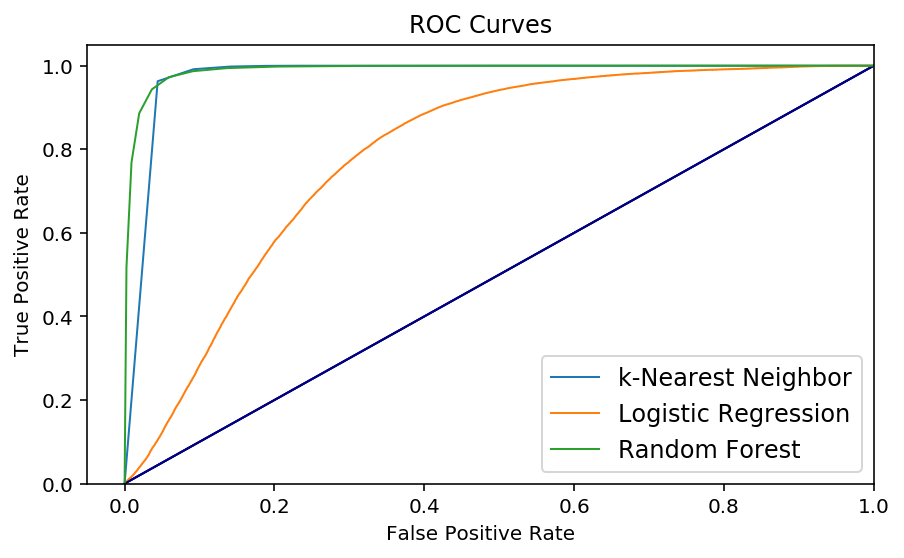

In [85]:
classifiers = [KNeighborsClassifier(), LogisticRegression(), RandomForestClassifier()]
class_label = ["k-Nearest Neighbor", "Logistic Regression", "Random Forest"]
columns = ["Classifier", "AUC", "Accuracy", "Precision", "Recall"]

classif_df = pd.DataFrame(index=[0], columns=columns)
fig = plt.figure(figsize=(12, 4))

for classif in classifiers:

    # fit to training set
    classif.fit(x_train_pca, y_train_sm)

    # predict on testing set
    y_pred = classif.predict(x_test_pca)

    # score accuracy
    acc = accuracy_score(y_test_sm, y_pred)

    # find probabilities
    y_pred_prob = classif.predict_proba(x_test_pca)[:, 1]

    # find ROC curves
    fpr, tpr, thresholds = roc_curve(y_test_sm, y_pred_prob)
    rocauc = roc_auc_score(y_test_sm, y_pred_prob)

    # plot ROC curves
    ax1 = plt.subplot(121)
    plt.plot([0, 1], [0, 1], color= "navy", lw=1)
    plt.plot(fpr, tpr, lw=1, label=class_label[classifiers.index(classif)])
    plt.xlim([-.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves")
    plt.legend(loc= "best", fontsize=12)

    # calculate precision and recall scores
    prscore = precision_score(y_test_sm, classif.predict(x_test_pca))
    recscore = recall_score(y_test_sm, classif.predict(x_test_pca))

    # add scores into dataframe
    classif_df.loc[classifiers.index(classif)] = [class_label[classifiers.index(classif)],
                                          "{:.2%}".format(rocauc),
                                          "{:.2%}".format(acc), "{:.2%}".format(prscore),
                                          "{:.2%}".format(recscore)]

# plot ROC curves on same plot
plt.tight_layout()
classif_df = classif_df.set_index("Classifier")
print(classif_df)
plt.show()


## Observations 
Here, we see that random forest still has the highest performance. However, performance decreases with PCA. For that reason, we attempted to fine tune the random forest model. We attempted this through a randomized grid search and cross validation to determine ideal parameters, however, due to the lack of computing power and resources available, we were not able fine tune the model and decided to extend this into future steps.

# Extracting useful features

Due to the limited processing power we have at the moment, we ended our model evaluations here and extracted the useful variables in predicting a "hit" song.

In [86]:
#source https://towardsdatascience.com/random-forest-in-python-24d0893d51c0
rf = RandomForestClassifier()
rf.fit(x_train_sm, y_train_sm)
y_pred_rf_sm = rf.predict(x_test_sm)
y_pred_prob_rf_sm = rf.predict_proba(x_test_sm)[:,1]
#rf_sm_roc = roc_auc_score(y_test_sm, y_pred_prob_rf_sm)

In [87]:
!pip install pydot

In [88]:
#Get numerical feature importances
importances = list(rf.feature_importances_)
#List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
#Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
#Print out the feature and importances 

[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: loudness_y           Importance: 0.18
Variable: mode_y               Importance: 0.15
Variable: key_y                Importance: 0.14
Variable: danceability_y       Importance: 0.08
Variable: duration_ms_y        Importance: 0.08
Variable: acousticness_y       Importance: 0.07
Variable: energy_y             Importance: 0.07
Variable: speechiness_y        Importance: 0.05
Variable: valence_y            Importance: 0.05
Variable: instrumentalness_y   Importance: 0.04
Variable: liveness_y           Importance: 0.04
Variable: tempo_y              Importance: 0.03
Variable: time_signature_y     Importance: 0.02


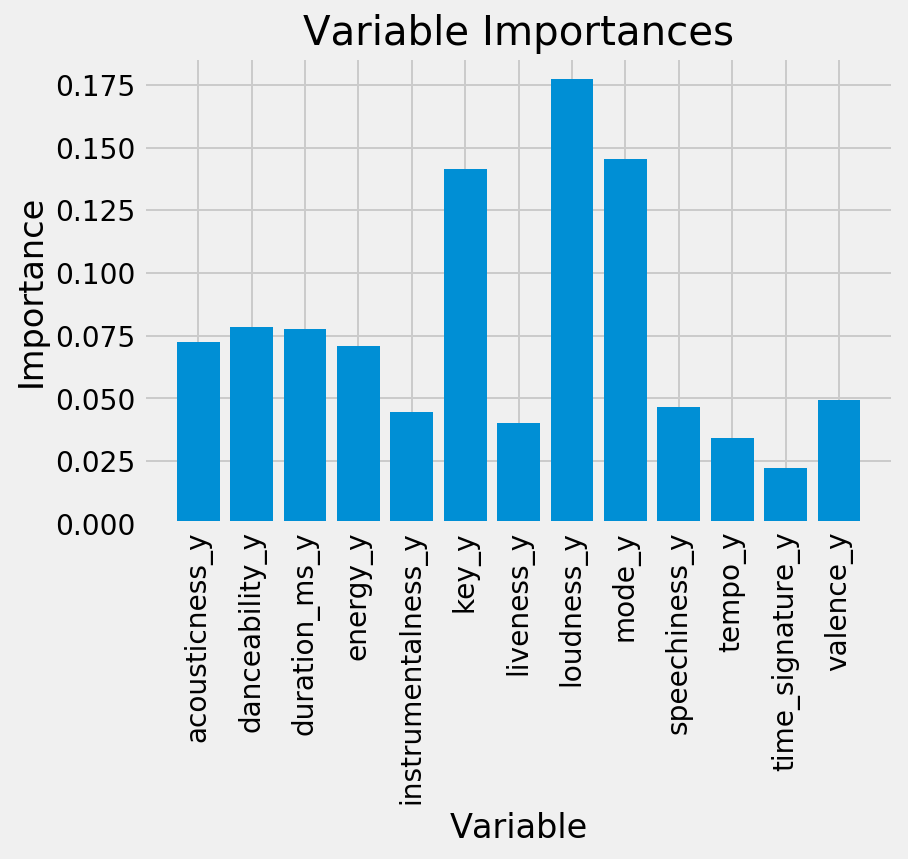

In [89]:
#Set the style
plt.style.use('fivethirtyeight')
#list of x locations for plotting
x_values = list(range(len(importances)))
#Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
#Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')
#Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 

In [90]:
#Look at parameters used by our current forest
print('Parameters currently in use:\n')
print(rf.get_params())

Parameters currently in use:

{'bootstrap': True, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


## Models and Evaluations

Throughout the process of building and testing models, we favored classifiers with accurate classifications and efficient run times. We began with a KNN, then tested a logistic regression classifier and then finally a random forest algorithm to find our champion model. Ultimately, we decided to keep two models to be researched further as logistic regression is easily interpretable but random forest offered the highest accuracy. In addition, both of these models are able to be fined tuned into better models.

# Conclusion and next steps

Our project sought to develop a model which could help accurately classify the features that would make a song a hit factor while preserving some form of interpretability. After data preprocessing, exploratory data analysis, model building and performance evaluation, we determined that our champion model was the random forest model because of its high predictive accuracy. While this is our optimal model at the moment, the important features extracted from the results above could be incorporated into the logistic regression for further enhancement. In addition, with better computing power, we would hypertune both the logistic and random forest model for a better model. Other factors that we would also consider include different sampling methods such as negative sampling and drawing out the basis of the PCA features. Overall, we are proud of what we achieved in this project and the insightful characteristics we were able to discover from this project.